# Inter-comparison and validation against in-situ measurements of satellite estimates of incoming solar radiation for Indien Ocean at BSRN site (RE)

**Auteur :**  GRONDIN Erwan

**Date :**  05/06/2024

In [24]:
# library
import glob
import os
import seaborn as sns
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import pvlib
from pvlib.location import Location
from pandas.plotting import register_matplotlib_converters
import plotly.graph_objects as go
import xarray as xr
import netCDF4 as nc
import sys
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime
import plotly.express as px
from plotly.subplots import make_subplots

from scipy.signal import savgol_filter
from sklearn.cluster import KMeans as KM
import warnings

#############################################################################################################
# Désactiver l'affichage des FutureWarnings temporairement
warnings.simplefilter(action='ignore', category=FutureWarning)
#############################################################################################################

#############################################################################################################
#sns.set(style="darkgrid", palette="bright",context = "paper",font="Arial" )
sns.set(style="darkgrid", palette="bright",context = "talk",font="Arial" )
#############################################################################################################

#############################################################################################################
def hourly_mean(df):
    data = df.copy()
    data.index = pd.to_datetime(data.index)
    
    # Filtrer les heures UTC entre 02h et 14h (inclus)
    df_filtered = data.between_time('02:00', '14:00')
    # Group data by hour and calculate the mean
    df_hourly_mean = df_filtered.resample('H').mean()
    return df_hourly_mean
#############################################################################################################
def daily_mean(df):
    data = df.copy()
    data.index = pd.to_datetime(data.index)
    
    # Filtrer les heures entre 01h et 15h (inclus)
    df_filtered = data.between_time('02:00', '14:00')
    # Group data by hour and calculate the mean
    df_daily_mean = df_filtered.resample('D').mean()
    return df_daily_mean


#############################################################################################################
def monthly_mean(df):
    data = df.copy()
    data.index = pd.to_datetime(data.index)
    # Group data by hour and calculate the mean
    df_mounthly_mean = data.resample('M').mean()
    return df_mounthly_mean


#############################################################################################################
def yearly_mean(df):
    data = df.copy()
    data.index = pd.to_datetime(data.index)
    # Group data by hour and calculate the mean
    df_yearly_mean = data.resample('Y').mean()
    return df_yearly_mean


#############################################################################################################
def count_nan(df):
    """
    Count the number of np.nan values in a DataFrame.

    Args :
        df (DataFrame) : pandas DataFrame

    Returns :
        count (Integer) : Number of np.nan values
    """
    # Count the number of np.nan in the DataFrame
    count = df.isnull().sum().sum()
    
    return count

#############################################################################################################
def Savitzky_Golay_filter(data, variable, WL ,PO):
    '''
    Input :
        data (dataframe) : datframe contains irradiance data
        variable (str) : name of column who you would like to smooth
    Return:
        df (dataframe) : dataframe filter with Savitzky-Golay
    '''
    
    df_1 = data.copy()
    df_2 = pd.DataFrame(df_1[variable])
    int_nan_value = count_nan(df_2) # nombre de valeur manquante avant la selection entre 02H et 14H
    print("Le nombre de valeurs NaN avant la sélection :",int_nan_value)
    df_2.index = pd.to_datetime(df_2.index)
    df_filtered = df_2.between_time('02:00', '14:00')

    df_cleaned = df_filtered.dropna(how='all')
    
    final_nan_value = count_nan(df_filtered) # nombre de valeur manquante après la selection entre 02H et 14H
    print("Le nombre de valeurs NaN après la sélection :",final_nan_value)


    smoothed_data = savgol_filter(df_cleaned[variable], WL, PO)
    df_cleaned_cop = df_cleaned.copy()
    df_cleaned_cop[f'{variable}_smoothed'] = smoothed_data
    df = df_cleaned_cop.clip(lower=0)
    df.index = pd.to_datetime(df.index)

    return df

#############################################################################################################
def formalisation_data(data_filter):
    mydf = data_filter.copy()
    # Supprimer le nom de l'index de la copie
    mydf.index.name = None
    mydf.index = pd.to_datetime(mydf.index)
    mydf = mydf.reset_index()
    mydf = mydf.rename(columns={'index': 'timestamp'})
    #mydf = mydf.rename(columns={variable: 'SIS_filtred'})
    mydf['date'] = mydf['timestamp'].dt.strftime('%Y/%m/%d')
    mydf['date'] = pd.to_datetime(mydf['date'], format='%Y/%m/%d')
    mydf['heure'] = mydf['timestamp'].dt.strftime('%H:%M:%S')
    mydf['ID'] =  ['D{}'.format(i + 1) for i in mydf.index]
    # Trouver la première date
    first_date = mydf['date'].min()
    # Calculer le nombre de jours écoulés depuis la première date
    mydf['ID_date'] = (mydf['date'] - first_date).dt.days + 1
    return mydf

#############################################################################################################
def scaled_data(data_filter,variable):
    mydf = data_filter.copy()
    mydf.index = pd.to_datetime(mydf.index)
    mydf = mydf.reset_index()
    mydf = mydf.rename(columns={'index': 'timestamp'})
    #mydf = mydf.rename(columns={variable: 'SIS_filtred'})
    mydf['date'] = mydf['timestamp'].dt.strftime('%Y/%m/%d')
    mydf['date'] = pd.to_datetime(mydf['date'], format='%Y/%m/%d')
    mydf['heure'] = mydf['timestamp'].dt.strftime('%H:%M:%S')
    mydf['ID'] =  ['D{}'.format(i + 1) for i in mydf.index]
    # Trouver la première date
    first_date = mydf['date'].min()
    # Calculer le nombre de jours écoulés depuis la première date
    mydf['ID_date'] = (mydf['date'] - first_date).dt.days + 1
    mydf2 = mydf.pivot_table(values=variable,index='heure',columns='ID_date')
    scaled_mydf2 = (mydf2 - mydf2.mean(axis = 0))
    scaled_mydf2_without_NaN = scaled_mydf2.dropna(axis=1, how='any')
    return scaled_mydf2 , scaled_mydf2_without_NaN

# Useful data

In [3]:
#######################################  SARAH ######################################################################
df_sarah_DNI = pd.read_csv('data_urmoufia/data_UTC/SARAH_3_DNI_moufia.csv', sep=';', index_col=0)
df_sarah_GHI = pd.read_csv('data_urmoufia/data_UTC/SARAH_3_SIS_moufia.csv', sep=';', index_col=0)

#######################################  IN-SITU ######################################################################
df_urmoufia = pd.read_csv('data_urmoufia/data_UTC/urmoufia.csv', sep=';', index_col=0)
df_BSRN = pd.read_csv('data_urmoufia/data_UTC/BSRN_data_2016_08_01_to_2024_04_01.csv', sep=';', index_col=0)

In [4]:
print(f'Le nombre de valeurs manquantes dans la dataframe df_moufia : {count_nan(df_urmoufia)}')
print(f'Le nombre de valeurs manquantes dans la dataframe df_BSRN : {count_nan(df_BSRN)}')
print(f'Le nombre de valeurs manquantes dans la dataframe df_sarah_DNI : {count_nan(df_sarah_DNI)}')
print(f'Le nombre de valeurs manquantes dans la dataframe df_sarah_GHI : {count_nan(df_sarah_GHI)}')

Le nombre de valeurs manquantes dans la dataframe df_moufia : 671729
Le nombre de valeurs manquantes dans la dataframe df_BSRN : 338194
Le nombre de valeurs manquantes dans la dataframe df_sarah_DNI : 1253
Le nombre de valeurs manquantes dans la dataframe df_sarah_GHI : 1253


# Savitzky Golay filter parameters

Two possibility : 
+ WL = 5 and PO = 2
+ WL =13 and PO = 7

In [ ]:
def Savitzky_Golay_filter(data, variable, WL ,PO):
    '''
    Input :
        data (dataframe) : datframe contains irradiance data
        variable (str) : name of column who you would like to smooth
    Return:
        df_without_NaN (dataframe) : dataframe contains smoothed data of variable
    '''
    # Supprimer les lignes contenant des valeurs NaN
    df_1 = data.copy()
    df_2 = pd.DataFrame(df_1[variable])
    int_nan_value = count_nan(df_2) # nombre de valeur manquante avant la selection entre 02H et 14H
    print("Le nombre de valeurs NaN avant la sélection :",int_nan_value)
    df_2.index = pd.to_datetime(df_2.index)
    df_filtered = df_2.between_time('02:00', '14:00')

    df_cleaned = df_filtered.dropna(how='all')
    
    final_nan_value = count_nan(df_filtered) # nombre de valeur manquante après la selection entre 02H et 14H
    print("Le nombre de valeurs NaN après la sélection :",final_nan_value)


    smoothed_data = savgol_filter(df_cleaned[variable], WL, PO)
    df_cleaned[f'{variable}_smoothed'] = smoothed_data
    df = df_cleaned.clip(lower=0)
    df.index = pd.to_datetime(df.index)

    return df



In [25]:
df_moufia_filter_ghi = Savitzky_Golay_filter(df_urmoufia,'ghi',5,2)
print(f'Le nombre de valeurs manquantes dans la dataframe df_moufia : {count_nan(df_urmoufia)}')
print(f'Le nombre de valeurs manquantes dans la dataframe df_moufia après filtre : {count_nan(df_moufia_filter_ghi)}')

Le nombre de valeurs NaN avant la sélection : 64299
Le nombre de valeurs NaN après la sélection : 4580
Le nombre de valeurs manquantes dans la dataframe df_moufia : 671729
Le nombre de valeurs manquantes dans la dataframe df_moufia après filtre : 0


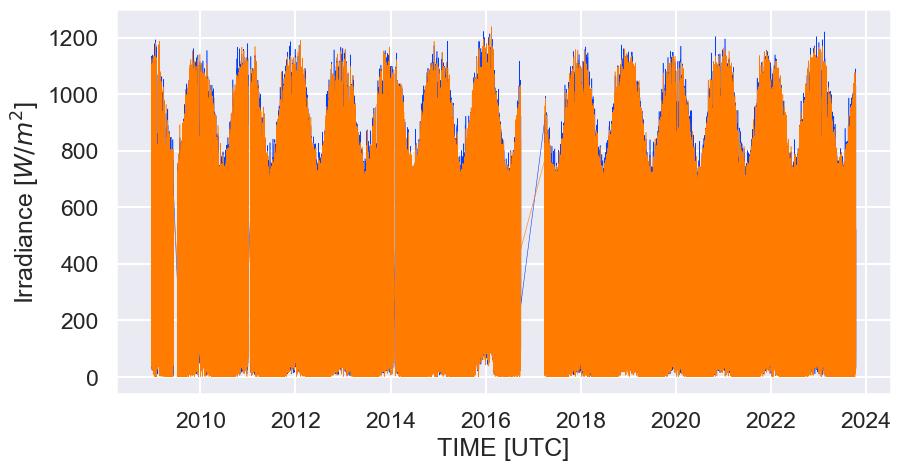

In [26]:
plt.figure(figsize=(10,5))
plt.plot(df_moufia_filter_ghi.index , df_moufia_filter_ghi['ghi'], label = 'GHI',lw = 0.4)
plt.plot(df_moufia_filter_ghi.index , df_moufia_filter_ghi['ghi_smoothed'], label = 'GHI filtred',lw = 0.4)
plt.xlabel('TIME [UTC]')
plt.ylabel('Irradiance [$W/m^2$]')
plt.show()

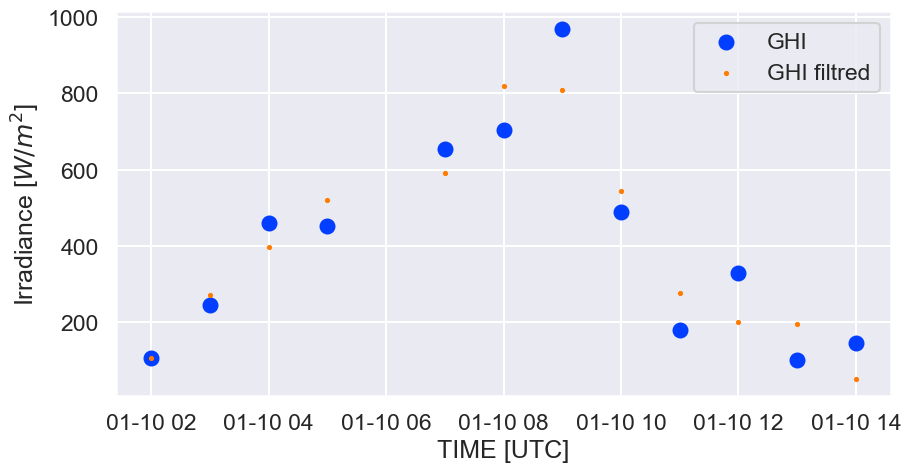

In [27]:
plt.figure(figsize=(10,5))
plt.scatter(df_moufia_filter_ghi['2009-01-10 00:00:00':'2009-01-11 00:00:00'].index, df_moufia_filter_ghi['2009-01-10 00:00:00':'2009-01-11 00:00:00']['ghi'], label = 'GHI',s=100)
plt.scatter(df_moufia_filter_ghi['2009-01-10 00:00:00':'2009-01-11 00:00:00'].index,df_moufia_filter_ghi['2009-01-10 00:00:00':'2009-01-11 00:00:00']['ghi_smoothed'], label = 'GHI filtred',s=5)
plt.xlabel('TIME [UTC]')
plt.ylabel('Irradiance [$W/m^2$]')
plt.legend()
plt.show()

# Select 2 saisons:

Summer : de octobre à février (10-03)

Winter : de février à octobre (04-09)

In [16]:
# Filtrer les mois d'octobre à février
df_summer = df_moufia_filter_ghi[df_moufia_filter_ghi.index.month.isin([10, 11, 12, 1, 2,3])]
df_winter = df_moufia_filter_ghi[df_moufia_filter_ghi.index.month.isin([4, 5, 6, 7, 8,9])]
df_summer

,ghi,ghi_smoothed
2008-12-20 04:00:00,683.372222,617.695518
2008-12-20 05:00:00,813.206897,878.556017
2008-12-20 06:00:00,948.044068,1029.680299
2008-12-20 07:00:00,1079.950000,1071.068364
2008-12-20 08:00:00,1134.233333,1014.048813
...,...,...
2023-10-12 13:00:00,58.920667,36.604921
2023-10-12 14:00:00,30.060000,16.889307
2023-10-13 02:00:00,72.005000,85.672740
2023-10-13 03:00:00,266.921667,255.326427


<Axes: >

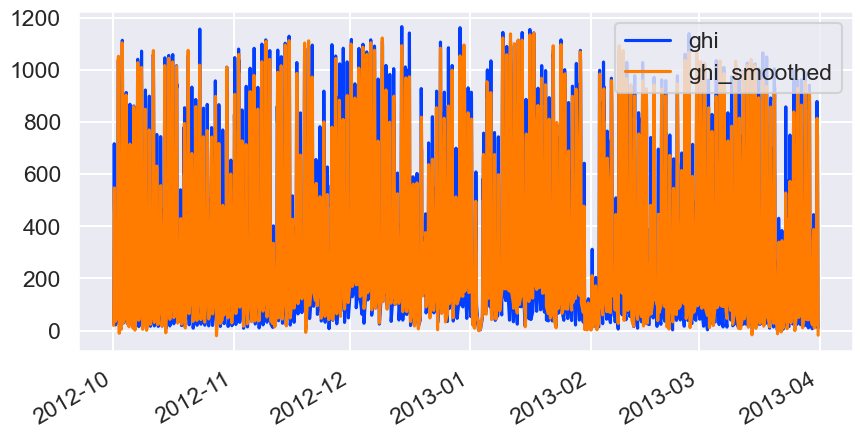

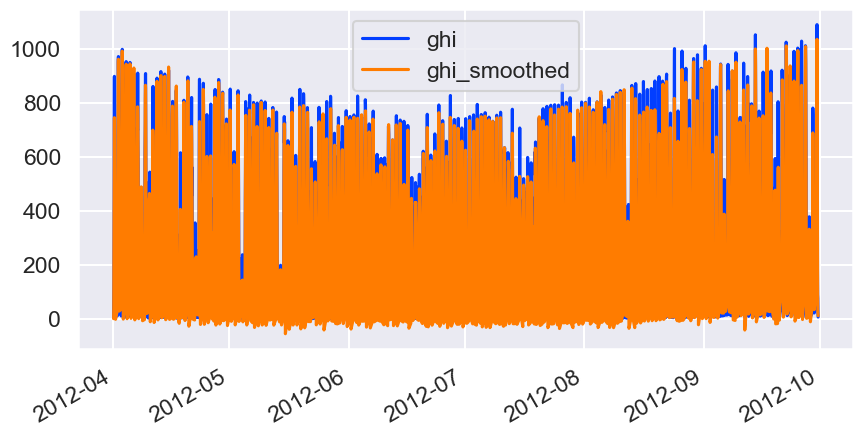

In [19]:
df_summer['2012-09':'2013-05'].plot(figsize = (10,5))
df_winter['2012':'2012-11'].plot(figsize = (10,5))

# TEST

In [96]:
mydf = formalisation_data(df_moufia_filter_ghi)
mydf

,timestamp,ghi,ghi_smoothed,date,heure,ID,ID_date
0,2008-12-20 04:00:00,683.372222,617.695518,2008-12-20,04:00:00,D1,1
1,2008-12-20 05:00:00,813.206897,878.556017,2008-12-20,05:00:00,D2,1
2,2008-12-20 06:00:00,948.044068,1029.680299,2008-12-20,06:00:00,D3,1
3,2008-12-20 07:00:00,1079.950000,1071.068364,2008-12-20,07:00:00,D4,1
4,2008-12-20 08:00:00,1134.233333,1014.048813,2008-12-20,08:00:00,D5,1
...,...,...,...,...,...,...,...
66005,2023-10-12 13:00:00,58.920667,36.604921,2023-10-12,13:00:00,D66006,5410
66006,2023-10-12 14:00:00,30.060000,16.889307,2023-10-12,14:00:00,D66007,5410
66007,2023-10-13 02:00:00,72.005000,85.672740,2023-10-13,02:00:00,D66008,5411
66008,2023-10-13 03:00:00,266.921667,255.326427,2023-10-13,03:00:00,D66009,5411


In [98]:
scaled_mydf2 , scaled_mydf2_without_NaN = scaled_data(df_summer,'ghi_smoothed')
scaled_mydf2

ID_date,1,2,3,4,5,6,7,8,9,10,...,5402,5403,5404,5405,5406,5407,5408,5409,5410,5411
heure,,,,,,,,,,,,,,,,,,,,,
02:00:00,NaN,-300.017206,NaN,-332.555353,-525.780642,-511.498907,-499.124787,-213.305415,-303.216554,NaN,...,-455.420533,-462.755563,-506.614174,-432.729459,-384.897272,-305.608751,-242.451516,-189.724166,-405.498960,-203.277105
03:00:00,NaN,-195.753674,NaN,-168.990774,-317.058229,-332.255510,-289.454914,-0.871479,-132.992236,NaN,...,-274.987146,-272.472611,-337.295878,-338.432198,-269.921148,-127.537839,-25.967630,-3.702952,-232.855317,-33.623418
04:00:00,20.900672,13.426766,-175.413341,11.442822,-74.518300,-64.241653,-54.298747,236.249902,97.583311,NaN,...,-33.982513,-39.999106,-83.080792,-120.318312,-53.182488,118.385074,215.180336,288.481421,-12.467349,236.900523
05:00:00,281.761171,215.334326,117.484507,235.620084,159.440390,195.213029,170.014308,494.066252,376.352795,NaN,...,214.094014,189.194620,201.185633,173.716938,198.944246,411.800193,327.749249,452.545429,224.002889,NaN
06:00:00,432.885453,354.361369,340.010637,426.174258,316.319374,378.054847,325.889959,517.491093,520.389494,106.272549,...,411.484160,365.725701,440.230056,440.447353,371.426441,527.220352,281.814335,418.505858,356.424111,NaN
07:00:00,474.273518,377.495913,394.253448,446.166322,416.032787,487.135958,425.174880,352.734347,472.103780,258.338998,...,455.942002,462.571257,555.697977,574.120146,420.002711,454.539082,123.670605,256.169112,420.622841,NaN
08:00:00,417.253967,323.079782,459.325689,242.187671,435.065327,514.166513,466.603292,82.121426,266.902827,334.302392,...,505.746843,491.732447,510.277739,502.240622,379.296362,227.839082,-17.640983,55.311445,455.871651,NaN
09:00:00,232.430878,113.941865,367.273784,32.002988,385.523025,403.281355,469.778372,-139.116050,0.019018,155.284160,...,400.573906,445.300622,390.395199,309.797130,229.769378,-0.299569,-49.339078,-118.228999,379.994238,NaN
10:00:00,-38.305703,-13.878540,163.490673,-82.470853,266.489438,220.851275,304.930626,-269.119772,-223.362332,7.426976,...,186.299414,250.372003,170.281358,83.544940,102.367298,-152.416712,2.278525,-159.012658,183.434453,NaN





Il faut supprimer les journées qui possèdent des valeurs manquantes car la méthode utilisée ne permet pas la présence de NaN.




In [99]:
scaled_mydf2_without_NaN

ID_date,2,4,5,6,7,8,9,14,15,16,...,5401,5402,5403,5404,5405,5406,5407,5408,5409,5410
heure,,,,,,,,,,,,,,,,,,,,,
02:00:00,-300.017206,-332.555353,-525.780642,-511.498907,-499.124787,-213.305415,-303.216554,-353.844412,-318.500557,-417.544842,...,-162.242350,-455.420533,-462.755563,-506.614174,-432.729459,-384.897272,-305.608751,-242.451516,-189.724166,-405.498960
03:00:00,-195.753674,-168.990774,-317.058229,-332.255510,-289.454914,-0.871479,-132.992236,-191.187039,-196.507795,-229.632667,...,33.607927,-274.987146,-272.472611,-337.295878,-338.432198,-269.921148,-127.537839,-25.967630,-3.702952,-232.855317
04:00:00,13.426766,11.442822,-74.518300,-64.241653,-54.298747,236.249902,97.583311,38.470001,38.850586,4.667682,...,259.172433,-33.982513,-39.999106,-83.080792,-120.318312,-53.182488,118.385074,215.180336,288.481421,-12.467349
05:00:00,215.334326,235.620084,159.440390,195.213029,170.014308,494.066252,376.352795,272.835596,310.102888,255.762761,...,355.795603,214.094014,189.194620,201.185633,173.716938,198.944246,411.800193,327.749249,452.545429,224.002889
06:00:00,354.361369,426.174258,316.319374,378.054847,325.889959,517.491093,520.389494,464.927278,404.068951,442.638206,...,312.561716,411.484160,365.725701,440.230056,440.447353,371.426441,527.220352,281.814335,418.505858,356.424111
07:00:00,377.495913,446.166322,416.032787,487.135958,425.174880,352.734347,472.103780,601.239024,485.517126,555.448285,...,175.551240,455.942002,462.571257,555.697977,574.120146,420.002711,454.539082,123.670605,256.169112,420.622841
08:00:00,323.079782,242.187671,435.065327,514.166513,466.603292,82.121426,266.902827,541.569501,299.211967,519.191142,...,13.830525,505.746843,491.732447,510.277739,502.240622,379.296362,227.839082,-17.640983,55.311445,455.871651
09:00:00,113.941865,32.002988,385.523025,403.281355,469.778372,-139.116050,0.019018,304.841882,118.961554,341.838761,...,-73.169046,400.573906,445.300622,390.395199,309.797130,229.769378,-0.299569,-49.339078,-118.228999,379.994238
10:00:00,-13.878540,-82.470853,266.489438,220.851275,304.930626,-269.119772,-223.362332,-3.633293,-29.609779,71.448936,...,-90.337124,186.299414,250.372003,170.281358,83.544940,102.367298,-152.416712,2.278525,-159.012658,183.434453


In [44]:

nclus = 5 #number of clusters

[nobs,nvar] = scaled_mydf2.shape
cols = np.arange(0,nvar)

kmSR_stan = KM(n_clusters = nclus, n_init=300, init='k-means++').fit(scaled_mydf2_without_NaN.T)#kmeans
#print("\n ",kmSR_stan)

# récupération des labels et centroides
day_class = kmSR_stan.labels_.T
print("\n les classes des jours : ",day_class)#les valeurs 0 1 2 3 des classes

centro = kmSR_stan.cluster_centers_[:,:].T #recupération des centroides
print("\n les centres : ",centro)
print("\n shape of centro : ",centro.shape)
centro = centro - centro[0]# to make the values on the same scale of solar radiation (re-standardisation)

print("\n les centres : ",centro)
print("\n shape of centro : ",centro.shape)


centrob = np.zeros(centro.shape)#new matrice of zeros of the same size as the  matrix de centroides
centrob

C:\Users\erwan\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=10.
  warnings.warn(



 les classes des jours :  [1 1 0 ... 2 2 3]

 les centres :  [[-450.40831189 -274.91205661 -144.5045003  -389.41671174 -208.4625795 ]
 [-315.00573197  -97.71869949   26.0053474  -219.44114526 -141.49721362]
 [-116.25976143  134.77280186  213.29295692    5.95575576  -50.12660216]
 [ 102.47515349  359.31969532  306.98822742  231.40668498   44.00906067]
 [ 277.42397223  470.51549128  271.59326397  396.44474602  109.21780956]
 [ 391.86910711  425.01820235  151.62447208  477.75801765  153.49161492]
 [ 431.38281431  256.19072386   22.7430936   443.78942488  171.76336921]
 [ 387.50438489   47.44254962  -53.74714388  299.47404911  165.9858119 ]
 [ 256.34321499 -125.24554584  -82.09124635   89.09539291  125.31260636]
 [  53.40884425 -221.98589775 -112.45199863 -130.31953255   49.14239221]
 [-171.13268291 -283.81472244 -160.81712201 -311.65736289  -51.38757454]
 [-371.62676603 -341.33451393 -215.84301392 -430.87758562 -156.02533223]
 [-475.97423704 -348.24802823 -222.7923363  -462.21173324 -211

array([[0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.]])

In [45]:
print(int(np.mean(centro[:,0])))
print(int(np.mean(centro[:,1])))
print(int(np.mean(centro[:,2])))
print(int(np.mean(centro[:,3])))
print(int(np.mean(centro[:,4])))

450
274
144
389
208


In [46]:
# to know the average of each centroide and the corresponding class
for i in range(5) :
    if int(np.mean(centro[:,i]) )== 144 :#Obscure # the values change according to the data
        centrob[:,0] = centro[:,i]
        print("overcast",i)
        obs = i
    if int(np.mean(centro[:,i])) == 389 :#cad Clear AM #each value of these 4 values(92, 171, 158, 221) presents the average of each column of centroides in the 4 classes
        centrob[:,1] = centro[:,i]
        print("Clear AM",i)#AM 
        AM = i
    if int(np.mean(centro[:,i])) == 274 :# Clear PM
        centrob[:,2] = centro[:,i]
        print("Clear PM",i)
        PM = i
    if int(np.mean(centro[:,i])) == 450 :#bright
        centrob[:,3] = centro[:,i]
        print("bright",i)
        Br = i
    if int(np.mean(centro[:,i])) == 208 :#random
        centrob[:,4] = centro[:,i]
        print("random",i)
        random = i

bright 0
Clear PM 1
overcast 2
Clear AM 3
random 4


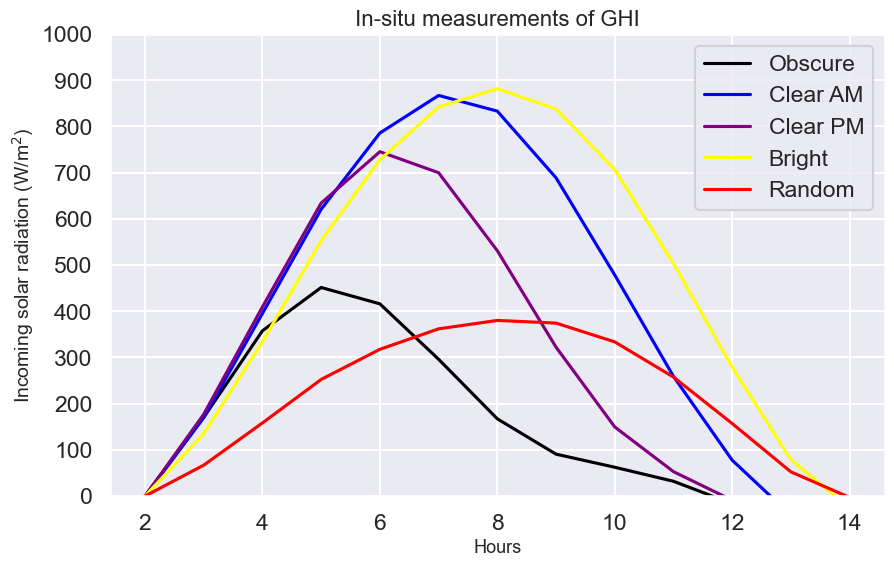

In [47]:


fig1 = plt.figure(figsize=(10,6))
lc=['black','blue','purple','yellow','red']
major_xticks1 = np.arange(0,24,2)
minor_xticks1 = np.arange(0,24,1)
# Exemple de valeurs pour les heures
hours = list(range(2,15))


for nf in range(5):
    lines = plt.plot(hours,centrob[:,nf])
    plt.setp(lines,color=lc[nf])

plt.xlabel('Hours', fontdict={'fontsize': 13})
plt.ylabel('Incoming solar radiation (W/m$^2$)', fontdict={'fontsize': 14})
plt.locator_params(nbins=12)
plt.legend(['Obscure','Clear AM','Clear PM','Bright','Random'])
plt.title("In-situ measurements of GHI",fontdict={'fontsize': 16})
plt.ylim(0,1000)
plt.savefig("data_urmoufia/img/KM_insitu.jpg")
plt.show()

In [110]:
df_test = pd.DataFrame(index=scaled_mydf2_without_NaN.columns)
df_test['day_class'] = day_class
df_test

,day_class
ID_date,
2,1
4,1
5,0
6,0
7,0
...,...
5406,3
5407,1
5408,2


In [111]:
mydf = formalisation_data(df_summer)
mydf

,timestamp,ghi,ghi_smoothed,date,heure,ID,ID_date
0,2008-12-20 04:00:00,683.372222,617.695518,2008-12-20,04:00:00,D1,1
1,2008-12-20 05:00:00,813.206897,878.556017,2008-12-20,05:00:00,D2,1
2,2008-12-20 06:00:00,948.044068,1029.680299,2008-12-20,06:00:00,D3,1
3,2008-12-20 07:00:00,1079.950000,1071.068364,2008-12-20,07:00:00,D4,1
4,2008-12-20 08:00:00,1134.233333,1014.048813,2008-12-20,08:00:00,D5,1
...,...,...,...,...,...,...,...
31309,2023-10-12 13:00:00,58.920667,36.604921,2023-10-12,13:00:00,D31310,5410
31310,2023-10-12 14:00:00,30.060000,16.889307,2023-10-12,14:00:00,D31311,5410
31311,2023-10-13 02:00:00,72.005000,85.672740,2023-10-13,02:00:00,D31312,5411
31312,2023-10-13 03:00:00,266.921667,255.326427,2023-10-13,03:00:00,D31313,5411


In [112]:
# Effectue une jointure sur la colonne 'ID_date'
merged_df = pd.merge(mydf, df_test, on='ID_date', how='left')

merged_df

,timestamp,ghi,ghi_smoothed,date,heure,ID,ID_date,day_class
0,2008-12-20 04:00:00,683.372222,617.695518,2008-12-20,04:00:00,D1,1,NaN
1,2008-12-20 05:00:00,813.206897,878.556017,2008-12-20,05:00:00,D2,1,NaN
2,2008-12-20 06:00:00,948.044068,1029.680299,2008-12-20,06:00:00,D3,1,NaN
3,2008-12-20 07:00:00,1079.950000,1071.068364,2008-12-20,07:00:00,D4,1,NaN
4,2008-12-20 08:00:00,1134.233333,1014.048813,2008-12-20,08:00:00,D5,1,NaN
...,...,...,...,...,...,...,...,...
31309,2023-10-12 13:00:00,58.920667,36.604921,2023-10-12,13:00:00,D31310,5410,3.0
31310,2023-10-12 14:00:00,30.060000,16.889307,2023-10-12,14:00:00,D31311,5410,3.0
31311,2023-10-13 02:00:00,72.005000,85.672740,2023-10-13,02:00:00,D31312,5411,NaN
31312,2023-10-13 03:00:00,266.921667,255.326427,2023-10-13,03:00:00,D31313,5411,NaN


In [113]:
# Crée une nouvelle dataframe avec les lignes où 'day_class' est égal à 0
filtered_df_class0 = merged_df[merged_df['day_class'] == 0.0]
filtered_df_class0

,timestamp,ghi,ghi_smoothed,date,heure,ID,ID_date,day_class
48,2008-12-24 02:00:00,82.071833,130.476333,2008-12-24,02:00:00,D49,5,0.0
49,2008-12-24 03:00:00,371.918333,339.198746,2008-12-24,03:00:00,D50,5,0.0
50,2008-12-24 04:00:00,602.633333,581.738675,2008-12-24,04:00:00,D51,5,0.0
51,2008-12-24 05:00:00,819.733333,815.697365,2008-12-24,05:00:00,D52,5,0.0
52,2008-12-24 06:00:00,964.600000,972.576349,2008-12-24,06:00:00,D53,5,0.0
...,...,...,...,...,...,...,...,...
31215,2023-10-05 10:00:00,881.811667,832.525667,2023-10-05,10:00:00,D31216,5403,0.0
31216,2023-10-05 11:00:00,623.796667,562.763643,2023-10-05,11:00:00,D31217,5403,0.0
31217,2023-10-05 12:00:00,190.695000,289.325163,2023-10-05,12:00:00,D31218,5403,0.0
31218,2023-10-05 13:00:00,59.698833,81.297969,2023-10-05,13:00:00,D31219,5403,0.0


In [116]:
data_class0 = filtered_df_class0.pivot_table(values="ghi_smoothed",index='heure',columns='ID_date')
data_class0

ID_date,5,6,7,35,40,41,67,74,76,77,...,5198,5199,5200,5201,5202,5207,5210,5215,5399,5403
heure,,,,,,,,,,,,,,,,,,,,,
02:00:00,130.476333,90.033706,112.448587,111.627516,135.102540,99.864687,196.854355,-4.381218,26.180389,74.643973,...,70.522745,97.664347,4.344517,65.004933,55.683265,67.538659,41.676245,30.750937,92.245784,119.398101
03:00:00,339.198746,269.277103,322.118460,244.986794,283.462079,263.227340,154.017244,-20.191698,163.126786,211.438856,...,202.909208,213.303568,113.074760,208.163205,166.184565,203.831135,77.530587,166.747571,290.615162,309.681052
04:00:00,581.738675,537.290960,557.274627,504.718079,507.866000,502.567400,235.229641,94.375052,399.512992,428.067511,...,455.323540,433.133153,203.569245,422.428178,380.834227,424.377373,254.027696,367.815849,524.641708,542.154558
05:00:00,815.697365,796.745643,781.587683,691.564270,747.901952,741.803400,527.632565,329.825286,664.212754,656.982408,...,589.469322,680.152705,377.030948,653.829344,653.041933,653.518405,491.046248,599.296921,748.076771,771.348284
06:00:00,972.576349,979.587460,937.463333,855.208175,931.915476,949.934841,779.703544,615.908865,863.726429,835.797333,...,678.771095,874.599730,569.190905,882.761460,801.893714,835.578651,669.725111,794.519127,920.117857,947.879365
07:00:00,1072.289762,1088.668571,1036.748254,983.068968,1058.880159,1063.044762,971.398867,898.080841,937.629762,966.826746,...,765.825635,985.538810,751.079365,904.303492,816.066746,947.826429,810.797937,913.322937,1018.466032,1044.724921
08:00:00,1091.322302,1115.699127,1078.176667,1064.875238,1110.972222,1103.201905,1096.358215,1039.757857,973.870635,1019.438413,...,855.577381,1012.844841,861.823889,863.035714,757.308095,999.797619,926.833651,945.037540,1056.758968,1073.886111
09:00:00,1041.780000,1004.813968,1081.351746,1065.916825,1092.787698,1067.361508,1022.372857,984.313810,940.511032,987.495079,...,879.875079,967.553254,909.890317,801.186429,678.284841,939.415317,853.120921,932.699254,974.472143,1027.454286
10:00:00,922.746413,822.383889,916.504000,1005.291476,977.520556,925.415746,881.909270,793.406714,848.830698,880.986857,...,786.752381,884.090238,755.350778,680.061270,616.887746,807.661413,754.447897,777.892317,840.145127,832.525667


In [117]:
df_test = data_class0.iloc[:,:5]
df_test

ID_date,5,6,7,35,40
heure,,,,,
02:00:00,130.476333,90.033706,112.448587,111.627516,135.102540
03:00:00,339.198746,269.277103,322.118460,244.986794,283.462079
04:00:00,581.738675,537.290960,557.274627,504.718079,507.866000
05:00:00,815.697365,796.745643,781.587683,691.564270,747.901952
06:00:00,972.576349,979.587460,937.463333,855.208175,931.915476
07:00:00,1072.289762,1088.668571,1036.748254,983.068968,1058.880159
08:00:00,1091.322302,1115.699127,1078.176667,1064.875238,1110.972222
09:00:00,1041.780000,1004.813968,1081.351746,1065.916825,1092.787698
10:00:00,922.746413,822.383889,916.504000,1005.291476,977.520556


In [118]:
data_class0.values.flatten()

array([130.47633333,  90.03370635, 112.4485873 , ..., -38.19326349,
        86.05914921, -34.44149048])

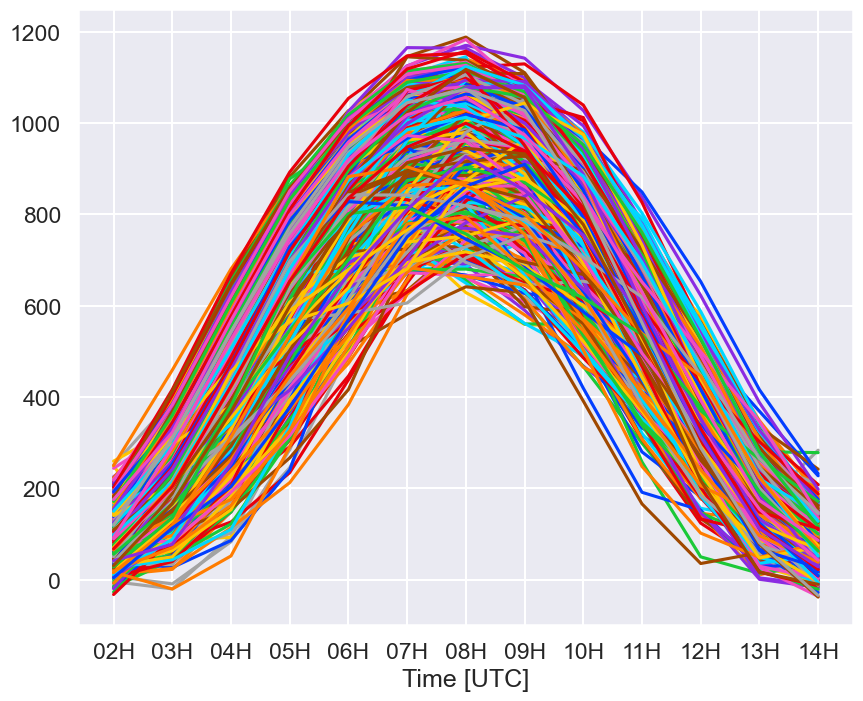

In [57]:
plt.figure(figsize=(10,8))
hours = [f"{hour:02d}H" for hour in range(2, 15)]
for col in data_class0.columns:
    plt.plot(hours, data_class0[col])

plt.xlabel('Time [UTC]')
plt.show()

In [83]:
heure = [i for i in range(1,15)]
heure

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]

In [97]:
df_test.columns

Index([5, 6, 7, 33, 35], dtype='int64', name='ID_date')

In [59]:
data_class0

ID_date,5,6,7,35,40,41,67,74,76,77,...,5198,5199,5200,5201,5202,5207,5210,5215,5399,5403
heure,,,,,,,,,,,,,,,,,,,,,
02:00:00,130.476333,90.033706,112.448587,111.627516,135.102540,99.864687,196.854355,-4.381218,26.180389,74.643973,...,70.522745,97.664347,4.344517,65.004933,55.683265,67.538659,41.676245,30.750937,92.245784,119.398101
03:00:00,339.198746,269.277103,322.118460,244.986794,283.462079,263.227340,154.017244,-20.191698,163.126786,211.438856,...,202.909208,213.303568,113.074760,208.163205,166.184565,203.831135,77.530587,166.747571,290.615162,309.681052
04:00:00,581.738675,537.290960,557.274627,504.718079,507.866000,502.567400,235.229641,94.375052,399.512992,428.067511,...,455.323540,433.133153,203.569245,422.428178,380.834227,424.377373,254.027696,367.815849,524.641708,542.154558
05:00:00,815.697365,796.745643,781.587683,691.564270,747.901952,741.803400,527.632565,329.825286,664.212754,656.982408,...,589.469322,680.152705,377.030948,653.829344,653.041933,653.518405,491.046248,599.296921,748.076771,771.348284
06:00:00,972.576349,979.587460,937.463333,855.208175,931.915476,949.934841,779.703544,615.908865,863.726429,835.797333,...,678.771095,874.599730,569.190905,882.761460,801.893714,835.578651,669.725111,794.519127,920.117857,947.879365
07:00:00,1072.289762,1088.668571,1036.748254,983.068968,1058.880159,1063.044762,971.398867,898.080841,937.629762,966.826746,...,765.825635,985.538810,751.079365,904.303492,816.066746,947.826429,810.797937,913.322937,1018.466032,1044.724921
08:00:00,1091.322302,1115.699127,1078.176667,1064.875238,1110.972222,1103.201905,1096.358215,1039.757857,973.870635,1019.438413,...,855.577381,1012.844841,861.823889,863.035714,757.308095,999.797619,926.833651,945.037540,1056.758968,1073.886111
09:00:00,1041.780000,1004.813968,1081.351746,1065.916825,1092.787698,1067.361508,1022.372857,984.313810,940.511032,987.495079,...,879.875079,967.553254,909.890317,801.186429,678.284841,939.415317,853.120921,932.699254,974.472143,1027.454286
10:00:00,922.746413,822.383889,916.504000,1005.291476,977.520556,925.415746,881.909270,793.406714,848.830698,880.986857,...,786.752381,884.090238,755.350778,680.061270,616.887746,807.661413,754.447897,777.892317,840.145127,832.525667


In [63]:
data_class0.index = pd.to_datetime(data_class0.index)
data_class0.index

DatetimeIndex(['2024-06-11 02:00:00', '2024-06-11 03:00:00',
               '2024-06-11 04:00:00', '2024-06-11 05:00:00',
               '2024-06-11 06:00:00', '2024-06-11 07:00:00',
               '2024-06-11 08:00:00', '2024-06-11 09:00:00',
               '2024-06-11 10:00:00', '2024-06-11 11:00:00',
               '2024-06-11 12:00:00', '2024-06-11 13:00:00',
               '2024-06-11 14:00:00'],
              dtype='datetime64[ns]', name='heure', freq=None)

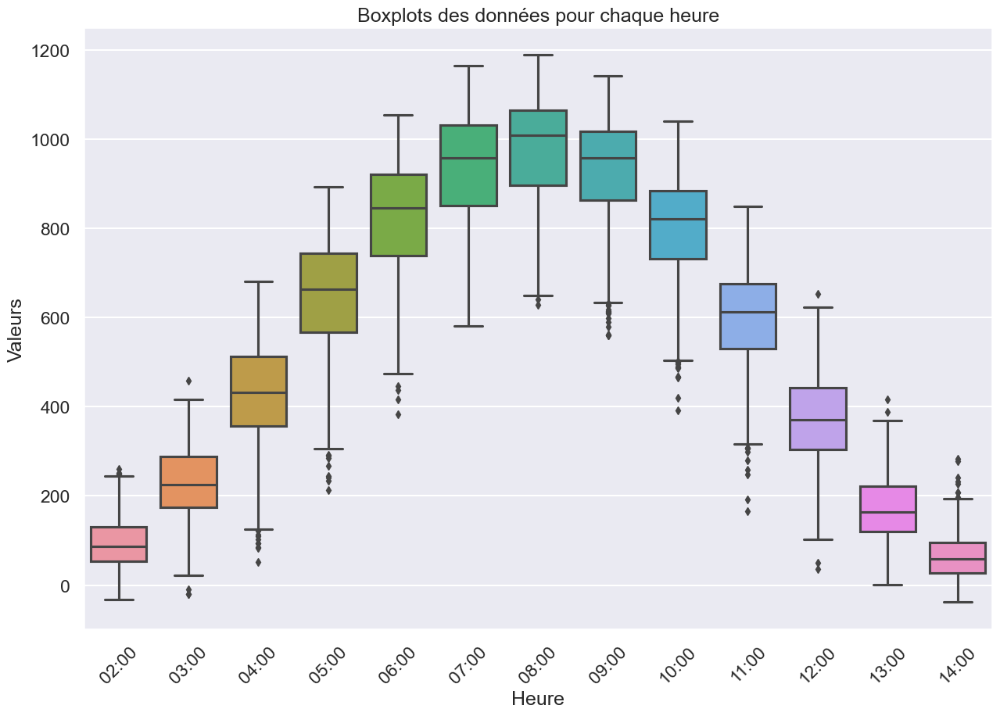

In [65]:
df = data_class0.copy()
df.index = pd.to_datetime(df.index)

# Tracer les boxplots
fig, ax = plt.subplots(figsize=(15, 10))

sns.boxplot(data=df.transpose(), ax=ax)
ax.set_xticklabels([t.strftime('%H:%M') for t in df.index], rotation=45)
ax.set_xlabel('Heure')
ax.set_ylabel('Valeurs')

plt.title('Boxplots des données pour chaque heure')
plt.show()

# Classification auto

In [28]:
df_urmoufia = pd.read_csv('data_urmoufia/data_UTC/urmoufia.csv', sep=';', index_col=0)
df_moufia_filter_ghi = Savitzky_Golay_filter(df_urmoufia, 'ghi', 7 , 2)
df_summer = df_moufia_filter_ghi[df_moufia_filter_ghi.index.month.isin([10, 11, 12, 1, 2,3])]
df_winter = df_moufia_filter_ghi[df_moufia_filter_ghi.index.month.isin([4, 5, 6, 7, 8,9])]

Le nombre de valeurs NaN avant la sélection : 64299
Le nombre de valeurs NaN après la sélection : 4580


## Boxplot

C:\Users\erwan\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=10.
  warnings.warn(



 les classes des jours :  [1 1 2 ... 3 3 2]
Clear AM 0
Clear PM 1
bright 2
overcast 3
random 4


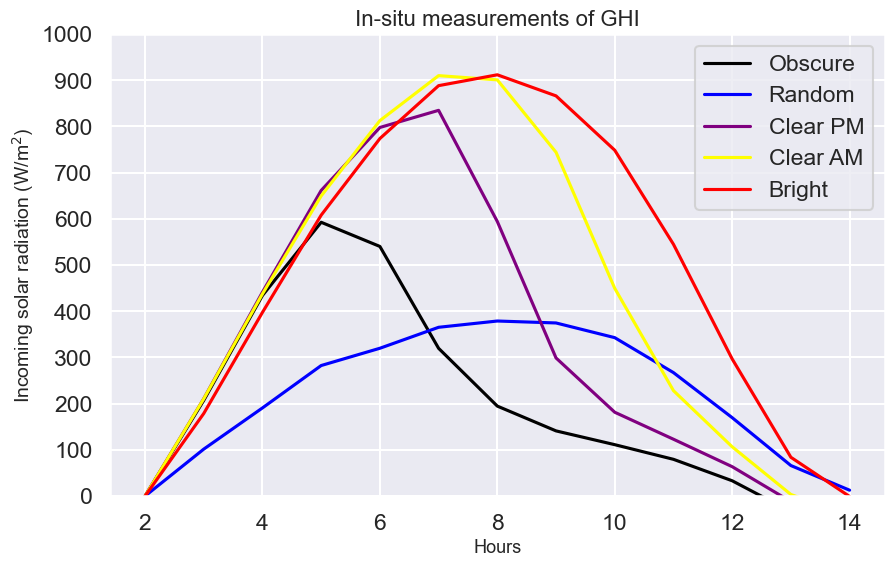

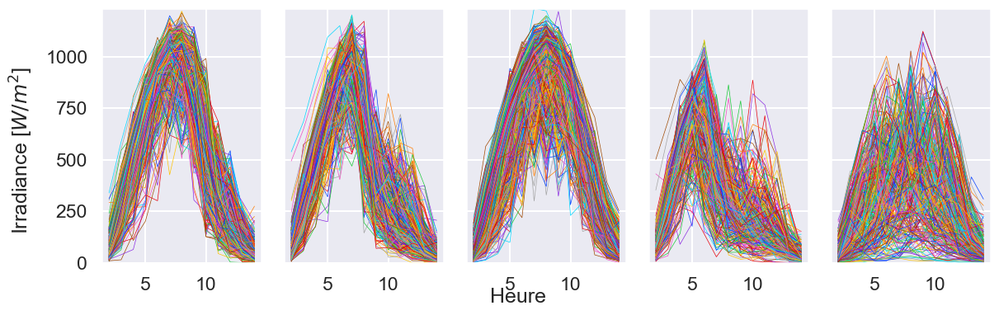

C:\Users\erwan\AppData\Local\Temp\ipykernel_12640\3223522698.py:126: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  data_class0.index = pd.to_datetime(data_class0.index)


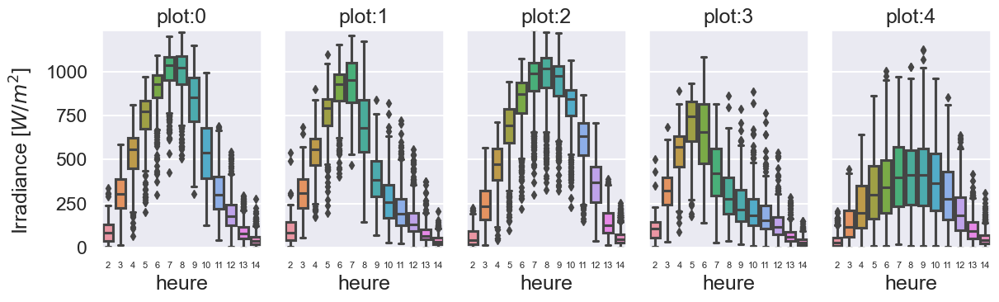

In [64]:
def classification_days(data_filter,variable):
    mydf = formalisation_data(data_filter)
    scaled_mydf2 , scaled_mydf2_without_NaN = scaled_data(data_filter,variable)
    nclus = 5 #number of clusters

    [nobs,nvar] = scaled_mydf2.shape
    cols = np.arange(0,nvar)
    
    kmSR_stan = KM(n_clusters = nclus, n_init=200, init='k-means++').fit(scaled_mydf2_without_NaN.T)#kmeans
    #print("\n ",kmSR_stan)
    
    # récupération des labels et centroides
    day_class = kmSR_stan.labels_.T
    print("\n les classes des jours : ",day_class)#les valeurs 0 1 2 3 des classes
    
    centro = kmSR_stan.cluster_centers_[:,:].T #recupération des centroides
    #print("\n les centres : ",centro)
    #print("\n shape of centro : ",centro.shape)
    centro = centro - centro[0]# to make the values on the same scale of solar radiation (re-standardisation)
    
    #print("\n les centres : ",centro)
    #print("\n shape of centro : ",centro.shape)
    
    
    centrob = np.zeros(centro.shape)#new matrice of zeros of the same size as the  matrix de centroides
    centrob

    #print(int(np.mean(centro[:,0])))
    #print(int(np.mean(centro[:,1])))
    #print(int(np.mean(centro[:,2])))
    #print(int(np.mean(centro[:,3])))
    #print(int(np.mean(centro[:,4])))
    classe_values = sorted([int(np.mean(centro[:,i])) for i in range(5)])
    #print(classe_values)

    
    for i in range(5) :
        if int(np.mean(centro[:,i]) )== classe_values[0]:#Obscure # the values change according to the data
            centrob[:,0] = centro[:,i]
            print("overcast",i)
            obs = i
        if int(np.mean(centro[:,i])) == classe_values[1] :#random
            centrob[:,1] = centro[:,i]
            print("random",i)
            random = i
        if int(np.mean(centro[:,i])) == classe_values[2] :# Clear PM
            centrob[:,2] = centro[:,i]
            print("Clear PM",i)
            PM = i
        if int(np.mean(centro[:,i])) == classe_values[3] :#cad Clear AM #each value of these 4 values(92, 171, 158, 221) presents the average of each column of centroides in the 4 classes
            centrob[:,3] = centro[:,i]
            print("Clear AM",i)#AM 
            AM = i
        if int(np.mean(centro[:,i])) == classe_values[4] :#bright
            centrob[:,4] = centro[:,i]
            print("bright",i)
            Br = i
        
    #print(centrob)
    fig1 = plt.figure(figsize=(10,6))
    lc=['black','blue','purple','yellow','red']
    major_xticks1 = np.arange(0,24,2)
    minor_xticks1 = np.arange(0,24,1)
    # Exemple de valeurs pour les heures
    hours = list(range(2,15))
    
    
    for nf in range(5):
        lines = plt.plot(hours,centrob[:,nf])
        plt.setp(lines,color=lc[nf])
    
    plt.xlabel('Hours', fontdict={'fontsize': 13})
    plt.ylabel('Incoming solar radiation (W/m$^2$)', fontdict={'fontsize': 14})
    plt.locator_params(nbins=12)
    plt.legend(['Obscure','Random','Clear PM','Clear AM','Bright'])
    plt.title("In-situ measurements of GHI",fontdict={'fontsize': 16})
    plt.ylim(0,1000)
    plt.savefig("data_urmoufia/img/KM_insitu.jpg")
    plt.show()

    df_formalised = pd.DataFrame(index=scaled_mydf2_without_NaN.columns)
    df_formalised['day_class'] = day_class
    # Effectue une jointure sur la colonne 'ID_date'
    merged_df = pd.merge(mydf, df_formalised, on='ID_date', how='left')

    # Crée une nouvelle dataframe avec les lignes où 'day_class' est égal à 0
    filtered_df_class0 = merged_df[merged_df['day_class'] == 0.0]
    data_class0 = filtered_df_class0.pivot_table(values=variable,index='heure',columns='ID_date')

    '''
    # all resultat por same class day
    plt.figure(figsize=(10,8))
    hours = [f"{hour:02d}H" for hour in range(2, 15)]
    for col in data_class0.columns:
        plt.plot(hours, data_class0[col],lw = 0.5)
    
    plt.xlabel('Time [UTC]')
    plt.show()
    '''
    # _________________________ all resultat por same class day _________________________
    fig, axs = plt.subplots(1, 5, figsize=(12, 4),sharey=True)
    
    # Variables pour stocker les limites des axes
    all_data = []
    for i in range(5):
        filtered_df_class = merged_df[merged_df['day_class'] == i]
        data_class = filtered_df_class.pivot_table(values=variable,index='heure',columns='ID_date')
        all_data.append(data_class.values.flatten())
        for col in data_class.columns:
            axs[i].plot(hours, data_class[col],lw = 0.5)
    # Détermination des limites des axes
    y_min = min([d.min() for d in all_data if len(d) > 0])
    y_max = max([d.max() for d in all_data if len(d) > 0])
    for ax in axs:
        ax.set_ylim(y_min, y_max)
        
    # Ajoutez les noms des axes une seule fois à la figure globale
    fig.text(0.5, 0.04, 'Heure', ha='center')
    fig.text(-0.015, 0.5, 'Irradiance [$W/m^2$]', va='center', rotation='vertical')
    plt.tight_layout()
    plt.show()

    

    # ___________________boxplot _________________________
    data_class0.index = pd.to_datetime(data_class0.index)

    fig, axs = plt.subplots(1, 5, figsize=(12, 4),sharey=True)
    
    # Variables pour stocker les limites des axes
    all_data = []
    for i in range(5):
        filtered_df_class = merged_df[merged_df['day_class'] == i]
        data_class = filtered_df_class.pivot_table(values=variable,index='heure',columns='ID_date')
        all_data.append(data_class.values.flatten())
        sns.boxplot(data=data_class.transpose(), ax=axs[i])
        axs[i].set_xticklabels(hours)
        #axs[i].set_xlabel('Heure')
        #axs[i].set_ylabel('Irradiance [$W/m^2$]')
        axs[i].set_title(f'plot:{i}')

        # Modification de la taille de police des étiquettes de l'axe x
        axs[i].tick_params(axis='x', labelsize=8)  # Réglez la taille de police selon vos préférences

    # Détermination des limites des axes
    y_min = min([d.min() for d in all_data if len(d) > 0])
    y_max = max([d.max() for d in all_data if len(d) > 0])
    for ax in axs:
        ax.set_ylim(y_min, y_max)
        
    # Ajoutez les noms des axes une seule fois à la figure globale
    #fig.text(0.5, 0.04, 'Heure', ha='center')
    fig.text(-0.015, 0.5, 'Irradiance [$W/m^2$]', va='center', rotation='vertical')
    plt.tight_layout()
    plt.show()
    return

classification_days(df_summer,'ghi')

C:\Users\erwan\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=11.
  warnings.warn(



 les classes des jours :  [2 3 2 ... 1 4 2]
Clear PM 0
random 1
Clear AM 2
overcast 3
bright 4


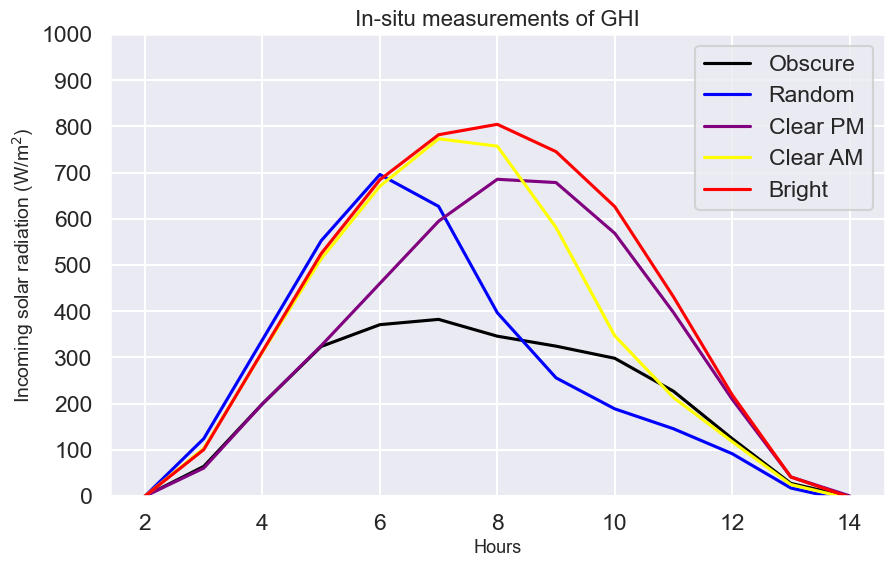

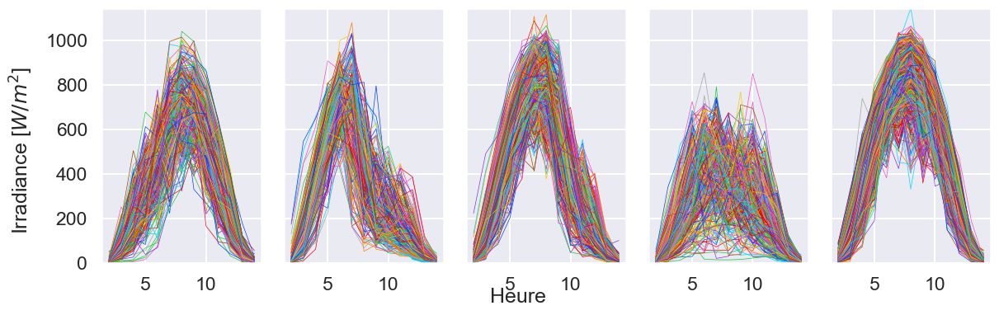

C:\Users\erwan\AppData\Local\Temp\ipykernel_19164\3223522698.py:126: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  data_class0.index = pd.to_datetime(data_class0.index)


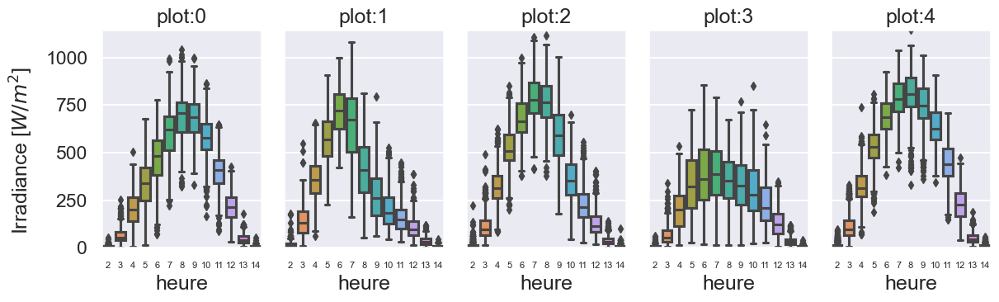

In [132]:
classification_days(df_winter,'ghi')

C:\Users\erwan\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=11.
  warnings.warn(



 les classes des jours :  [4 1 2 ... 3 2 2]
bright 0
overcast 1
Clear PM 2
random 3
Clear AM 4


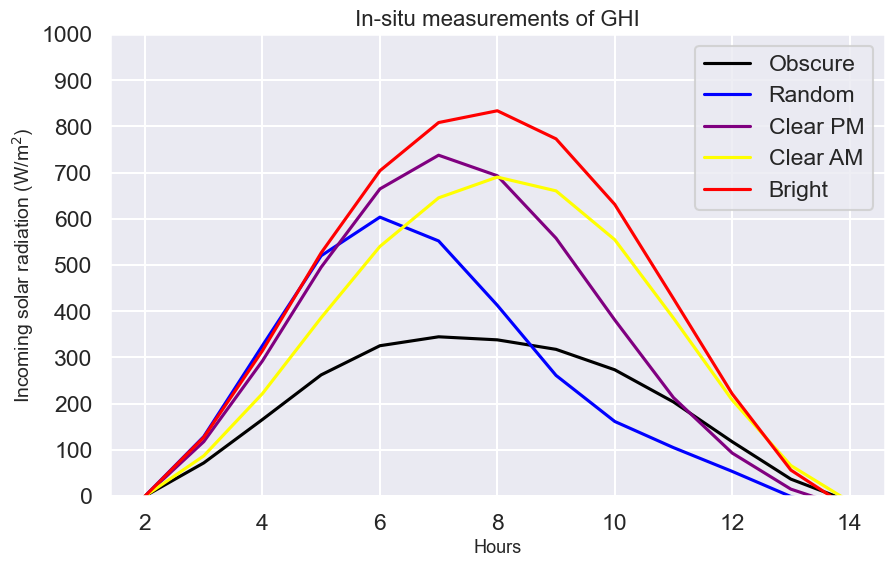

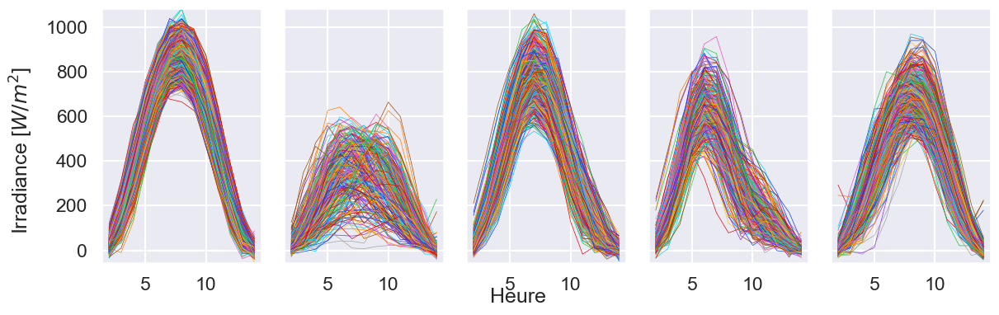

C:\Users\erwan\AppData\Local\Temp\ipykernel_19164\3223522698.py:126: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  data_class0.index = pd.to_datetime(data_class0.index)


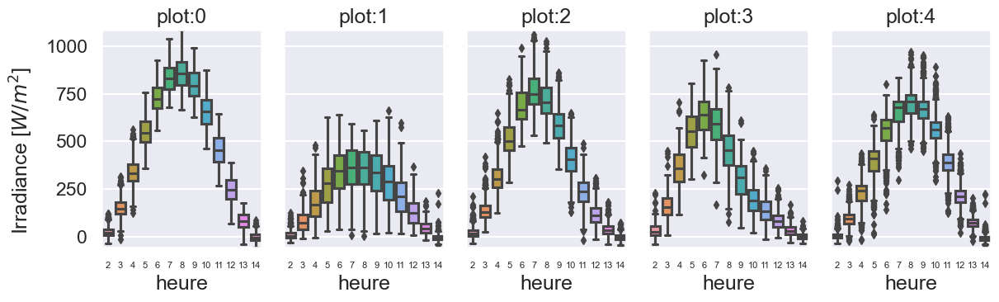

In [134]:
classification_days(df_winter,'ghi_smoothed')

## Frequency 

In [3]:
df_urmoufia = pd.read_csv('data_urmoufia/data_UTC/urmoufia.csv', sep=';', index_col=0)
df_moufia_filter_ghi = Savitzky_Golay_filter(df_urmoufia, 'ghi', 7 , 2)

Le nombre de valeurs NaN avant la sélection : 64299
Le nombre de valeurs NaN après la sélection : 4580


C:\Users\erwan\AppData\Local\Temp\ipykernel_3116\1319694158.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned[f'{variable}_smoothed'] = smoothed_data


In [5]:
def frequency_of_occurence(data,variable):
    mydf = formalisation_data(data)
    scaled_mydf2 , scaled_mydf2_without_NaN = scaled_data(data,variable)
    nclus = 5 #number of clusters

    [nobs,nvar] = scaled_mydf2.shape
    cols = np.arange(0,nvar)
    
    kmSR_stan = KM(n_clusters = nclus, n_init=300, init='k-means++').fit(scaled_mydf2_without_NaN.T)#kmeans
    #print("\n ",kmSR_stan)
    
    # récupération des labels et centroides
    day_class = kmSR_stan.labels_.T
    #print("\n les classes des jours : ",day_class)#les valeurs 0 1 2 3 des classes
    
    centro = kmSR_stan.cluster_centers_[:,:].T #recupération des centroides
    #print("\n les centres : ",centro)
    #print("\n shape of centro : ",centro.shape)
    centro = centro - centro[0]# to make the values on the same scale of solar radiation (re-standardisation)
    
    #print("\n les centres : ",centro)
    #print("\n shape of centro : ",centro.shape)
    
    
    centrob = np.zeros(centro.shape)#new matrice of zeros of the same size as the  matrix de centroides
    centrob

    classe_values = sorted([int(np.mean(centro[:,i])) for i in range(5)])
    #print(classe_values)

    
    for i in range(5) :
        if int(np.mean(centro[:,i]) )== classe_values[0]:#Obscure # the values change according to the data
            centrob[:,0] = centro[:,i]
            print("overcast",i)
            obs = i
        if int(np.mean(centro[:,i])) == classe_values[1] :#random
            centrob[:,1] = centro[:,i]
            print("random",i)
            random = i
        if int(np.mean(centro[:,i])) == classe_values[2] :# Clear PM
            centrob[:,2] = centro[:,i]
            print("Clear PM",i)
            PM = i
        if int(np.mean(centro[:,i])) == classe_values[3] :#cad Clear AM #each value of these 4 values(92, 171, 158, 221) presents the average of each column of centroides in the 4 classes
            centrob[:,3] = centro[:,i]
            print("Clear AM",i)#AM 
            AM = i
        if int(np.mean(centro[:,i])) == classe_values[4] :#bright
            centrob[:,4] = centro[:,i]
            print("bright",i)
            Br = i
    
    df_test = pd.DataFrame(index=scaled_mydf2_without_NaN.columns)
    df_test['day_class'] = day_class
    merged_df = pd.merge(mydf, df_test, on='ID_date', how='left')
    # Suppression des lignes contenant des valeurs NaN dans la colonne 'A'
    df_cleaned = merged_df.dropna(subset=['day_class'])
    taille_total = df_cleaned.shape[0]
    days_class_name = ['overcast','random','Clear PM','Clear AM','bright']
    L=[]
    for i in range(5):
        filtered_df_class = df_cleaned[merged_df['day_class'] == i]
        data_class = filtered_df_class.pivot_table(values=variable,index='heure',columns='ID_date')
        L.append(class_day[0].shape[0]/taille_total *100)
    return L

class_day = frequency_of_occurence(df_moufia_filter_ghi,'ghi')

bright 0
random 1
Clear AM 2
overcast 3
Clear PM 4


C:\Users\erwan\AppData\Local\Temp\ipykernel_3116\3531405802.py:63: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  filtered_df_class = df_cleaned[merged_df['day_class'] == i]


NameError: name 'class_day' is not defined

In [1]:
len(class_day)

NameError: name 'class_day' is not defined

In [143]:
class_day[0].shape[0]

(13, 543)

# Classification manuelle

## 1. Données brutes

In [ ]:
df_urmoufia = pd.read_csv('data_urmoufia/data_UTC/urmoufia.csv', sep=';', index_col=0)
df_moufia_filter_ghi = Savitzky_Golay_filter(df_urmoufia, 'ghi', 7 , 2)
df_summer = df_moufia_filter_ghi[df_moufia_filter_ghi.index.month.isin([10, 11, 12, 1, 2,3])]
df_winter = df_moufia_filter_ghi[df_moufia_filter_ghi.index.month.isin([4, 5, 6, 7, 8,9])]

## 2. Donées formalisées d'un format facile aux classification

In [137]:
df_summer_scaled,df_summer_scaled_without_NaN = scaled_data(df_summer,'ghi_smoothed')
df_summer_scaled_without_NaN

ID_date,2,4,5,6,7,8,9,14,15,16,...,5401,5402,5403,5404,5405,5406,5407,5408,5409,5410
heure,,,,,,,,,,,,,,,,,,,,,
02:00:00,-300.017206,-332.555353,-525.780642,-511.498907,-499.124787,-213.305415,-303.216554,-353.844412,-318.500557,-417.544842,...,-162.341066,-455.420533,-465.404908,-506.614174,-432.729459,-384.897272,-305.608751,-242.451516,-189.724166,-405.498960
03:00:00,-195.753674,-168.990774,-317.058229,-332.255510,-289.454914,-0.871479,-132.992236,-191.187039,-196.507795,-229.632667,...,33.509211,-274.987146,-275.121957,-337.295878,-338.432198,-269.921148,-127.537839,-25.967630,-3.702952,-232.855317
04:00:00,13.426766,11.442822,-74.518300,-64.241653,-54.298747,236.249902,97.583311,38.470001,38.850586,4.667682,...,259.073716,-33.982513,-42.648451,-83.080792,-120.318312,-53.182488,118.385074,215.180336,288.481421,-12.467349
05:00:00,215.334326,235.620084,159.440390,195.213029,170.014308,494.066252,376.352795,272.835596,310.102888,255.762761,...,355.696887,214.094014,186.545275,201.185633,173.716938,198.944246,411.800193,327.749249,452.545429,224.002889
06:00:00,354.361369,426.174258,316.319374,378.054847,325.889959,517.491093,520.389494,464.927278,404.068951,442.638206,...,312.463000,411.484160,363.076356,440.230056,440.447353,371.426441,527.220352,281.814335,418.505858,356.424111
07:00:00,377.495913,446.166322,416.032787,487.135958,425.174880,352.734347,472.103780,601.239024,485.517126,555.448285,...,175.452523,455.942002,459.921911,555.697977,574.120146,420.002711,454.539082,123.670605,256.169112,420.622841
08:00:00,323.079782,242.187671,435.065327,514.166513,466.603292,82.121426,266.902827,541.569501,299.211967,519.191142,...,13.731809,505.746843,489.083102,510.277739,502.240622,379.296362,227.839082,-17.640983,55.311445,455.871651
09:00:00,113.941865,32.002988,385.523025,403.281355,469.778372,-139.116050,0.019018,304.841882,118.961554,341.838761,...,-73.267762,400.573906,442.651276,390.395199,309.797130,229.769378,-0.299569,-49.339078,-118.228999,379.994238
10:00:00,-13.878540,-82.470853,266.489438,220.851275,304.930626,-269.119772,-223.362332,-3.633293,-29.609779,71.448936,...,-90.435840,186.299414,247.722657,170.281358,83.544940,102.367298,-152.416712,2.278525,-159.012658,183.434453


In [258]:
df_summer_form = formalisation_data(df_summer)
mydf_1 = df_summer_form.pivot_table(values='ghi_smoothed',index='heure',columns='ID_date')
mydf2 = mydf_1.dropna(axis=1, how='any')
mydf2

ID_date,2,4,5,6,7,8,9,14,15,16,...,5401,5402,5403,5404,5405,5406,5407,5408,5409,5410
heure,,,,,,,,,,,,,,,,,,,,,
02:00:00,164.203667,155.375071,130.476333,90.033706,112.448587,153.664937,181.181413,148.606325,52.191921,122.860286,...,104.279585,72.044608,119.398101,12.712690,5.617061,108.358906,121.969627,123.308514,112.246643,127.248754
03:00:00,268.467198,318.939651,339.198746,269.277103,322.118460,366.098873,351.405730,311.263698,174.184683,310.772460,...,300.129862,252.477995,309.681052,182.030986,99.914322,223.335030,300.040540,339.792400,298.267857,299.892397
04:00:00,477.647639,499.373246,581.738675,537.290960,557.274627,603.220254,581.981278,540.920738,409.543063,545.072810,...,525.694367,493.482628,542.154558,436.246072,318.028209,440.073690,545.963452,580.940367,590.452230,520.280365
05:00:00,679.555198,723.550508,815.697365,796.745643,781.587683,861.036603,860.750762,775.286333,680.795365,796.167889,...,622.317538,741.559156,771.348284,720.512497,612.063459,692.200424,839.378571,693.509279,754.516238,756.750603
06:00:00,818.582242,914.104683,972.576349,979.587460,937.463333,884.461444,1004.787460,967.378016,774.761429,983.043333,...,579.083651,938.949302,947.879365,959.556921,878.793873,864.682619,954.798730,647.574365,720.476667,889.171825
07:00:00,841.716786,934.096746,1072.289762,1088.668571,1036.748254,719.704698,956.501746,1103.689762,856.209603,1095.853413,...,442.073175,983.407143,1044.724921,1075.024841,1012.466667,913.258889,882.117460,489.430635,558.139921,953.370556
08:00:00,787.300655,730.118095,1091.322302,1115.699127,1078.176667,449.091778,751.300794,1044.020238,669.904444,1059.596270,...,280.352460,1033.211984,1073.886111,1029.604603,940.587143,872.552540,655.417460,348.119048,357.282254,988.619365
09:00:00,578.162738,519.933413,1041.780000,1004.813968,1081.351746,227.854302,484.416984,807.292619,489.654032,882.243889,...,193.352889,928.039048,1027.454286,909.722063,748.143651,723.025556,427.278810,316.420952,183.741810,912.741952
10:00:00,450.342333,405.459571,922.746413,822.383889,916.504000,97.850579,261.035635,498.817444,341.082698,611.854063,...,176.184811,713.764556,832.525667,689.608222,521.891460,595.623476,275.161667,368.038556,142.958151,716.182167


In [76]:
mydf2.iloc[:,:5]

ID_date,1,2,3,4,5
heure,,,,,
02:00:00,NaN,164.203667,NaN,155.375071,130.476333
03:00:00,NaN,268.467198,NaN,318.939651,339.198746
04:00:00,617.695518,477.647639,496.027002,499.373246,581.738675
05:00:00,878.556017,679.555198,788.924850,723.550508,815.697365
06:00:00,1029.680299,818.582242,1011.450980,914.104683,972.576349
07:00:00,1071.068364,841.716786,1065.693791,934.096746,1072.289762
08:00:00,1014.048813,787.300655,1130.766032,730.118095,1091.322302
09:00:00,829.225724,578.162738,1038.714127,519.933413,1041.780000
10:00:00,558.489143,450.342333,834.931016,405.459571,922.746413


### Clear sky

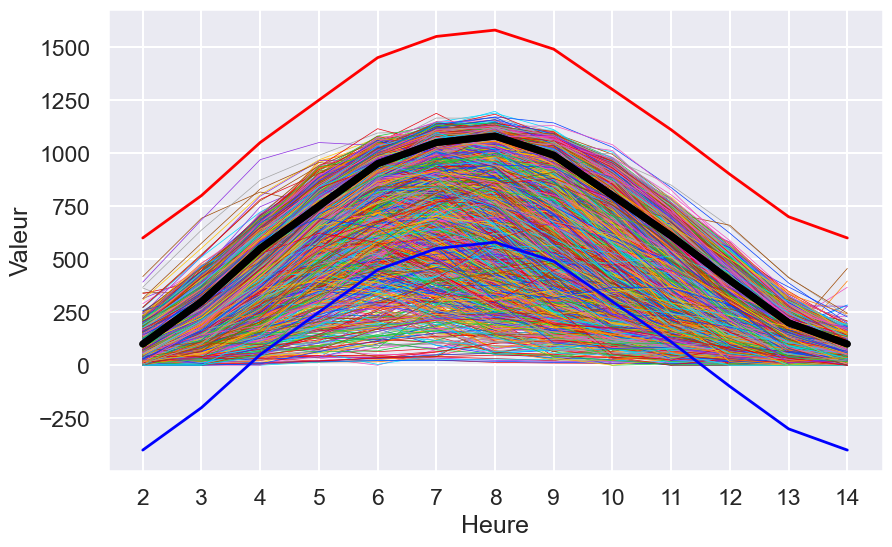

In [259]:
hours = list(range(2,15))
trend_sunny_day_summer = np.array([100, 300, 550, 750, 950, 1050, 1080, 990, 800, 610, 400, 200, 100])
trend_sunny_day_summer_max = np.array([val+500 for val in trend_sunny_day_summer])
trend_sunny_day_summer_min = np.array([val-500 for val in trend_sunny_day_summer])
plt.figure(figsize=(10,6))
for col in mydf2.columns:
    plt.plot(hours, mydf2[col],lw = 0.5)

# Tracer la ligne noire représentant la tendance ensoleillée
plt.plot(hours, trend_sunny_day_summer, lw=5, color='black')
plt.plot(hours, trend_sunny_day_summer_max, lw=2, color='red')
plt.plot(hours, trend_sunny_day_summer_min, lw=2, color='blue')

plt.plot(hours,trend_sunny_day_summer,lw= 5,color='black')
plt.grid(True)
plt.xticks(hours)
plt.xlabel('Heure')
plt.ylabel('Valeur')
plt.show()

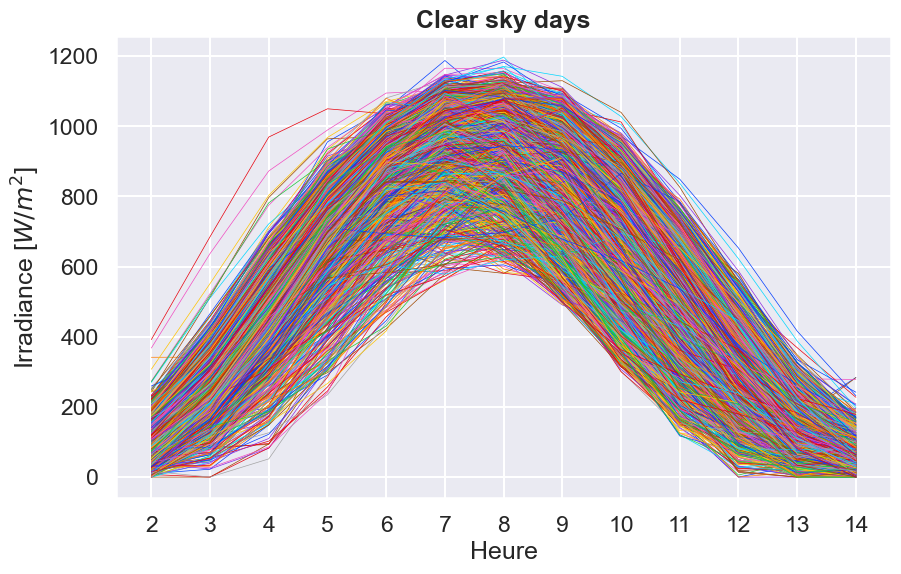

Le nombre de Clear sky trouvé :  1548


In [278]:
trend_sunny_day_summer = np.array([100, 300, 550, 720, 900, 1050, 1080, 990, 800, 610, 400, 200, 100])
trend_sunny_day_summer_max = np.array([val+500 for val in trend_sunny_day_summer])
trend_sunny_day_summer_min = np.array([val-500 for val in trend_sunny_day_summer])
# Seuil de corrélation pour considérer une journée comme ensoleillée
threshold = 0.97

# Liste pour stocker les colonnes (jours) qui passent dans le tube
selected_columns_sun_day = []

# Parcourir les colonnes de votre DataFrame
for col in mydf2.columns:
    ghi_values = mydf2[col].values
    # Vérifier si toutes les valeurs de ghi_values sont entre les tendances max et min
    if np.all((ghi_values >= trend_sunny_day_summer_min) & (ghi_values <= trend_sunny_day_summer_max)):
        selected_columns_sun_day.append(col)

df_sun_days = mydf2.loc[:, selected_columns_sun_day]


plt.figure(figsize=(10,6))
for col in df_sun_days.columns:
    plt.plot(hours, df_sun_days[col],lw = 0.5)
plt.grid(True)
plt.title('Clear sky days',  fontweight='bold')
plt.xticks(hours)
plt.xlabel('Heure')
plt.ylabel('Irradiance [$W/m^2$]')
plt.show()

print('Le nombre de Clear sky trouvé : ',len(selected_columns_sun_day))

### Clear AM

In [262]:
df_clear_AM = mydf2.drop(columns=selected_columns_sun_day)
df_clear_AM

ID_date,8,9,15,18,19,20,21,23,30,34,...,5194,5196,5206,5209,5213,5400,5401,5407,5408,5409
heure,,,,,,,,,,,,,,,,,,,,,
02:00:00,153.664937,181.181413,52.191921,119.905484,170.949365,142.527032,125.750878,139.114729,106.734125,96.774117,...,0.000000,54.440953,14.495971,41.690212,48.112307,84.507608,104.279585,121.969627,123.308514,112.246643
03:00:00,366.098873,351.405730,174.184683,293.857913,323.999524,327.668857,305.842317,316.821401,79.639708,91.354583,...,0.000000,204.985625,105.826559,201.972116,192.066441,252.448705,300.129862,300.040540,339.792400,298.267857
04:00:00,603.220254,581.981278,409.543063,560.608206,633.137698,555.751143,571.801897,542.060983,66.196655,109.883867,...,138.006772,355.434920,301.355640,379.872090,419.260788,491.874051,525.694367,545.963452,580.940367,590.452230
05:00:00,861.036603,860.750762,680.795365,800.318135,778.890476,743.077968,849.170005,821.129460,33.449627,189.972763,...,421.068761,538.225210,575.035121,625.548348,655.873054,749.353384,622.317538,839.378571,693.509279,754.516238
06:00:00,884.461444,1004.787460,774.761429,783.335349,694.908857,718.917619,962.508492,984.824911,0.000000,336.173294,...,588.893868,576.871921,837.343460,823.226952,716.660587,940.378254,579.083651,954.798730,647.574365,720.476667
07:00:00,719.704698,956.501746,856.209603,661.350714,430.889651,588.638603,860.196524,928.125667,73.779135,430.283865,...,645.412048,488.408810,921.730397,893.953540,598.277857,936.769127,442.073175,882.117460,489.430635,558.139921
08:00:00,449.091778,751.300794,669.904444,438.040556,253.141857,368.954429,585.708180,694.913841,120.851802,489.300873,...,562.852460,334.215238,776.892937,746.118079,421.073095,759.387222,280.352460,655.417460,348.119048,357.282254
09:00:00,227.854302,484.416984,489.654032,245.786349,153.861492,187.488659,308.583357,431.114889,130.799976,590.781667,...,482.756349,195.966905,509.621746,523.490944,324.775143,508.485317,193.352889,427.278810,316.420952,183.741810
10:00:00,97.850579,261.035635,341.082698,178.608730,217.805484,100.759024,161.542405,207.312667,112.530929,604.653095,...,481.771111,146.744317,269.828016,243.000013,346.972516,284.538587,176.184811,275.161667,368.038556,142.958151


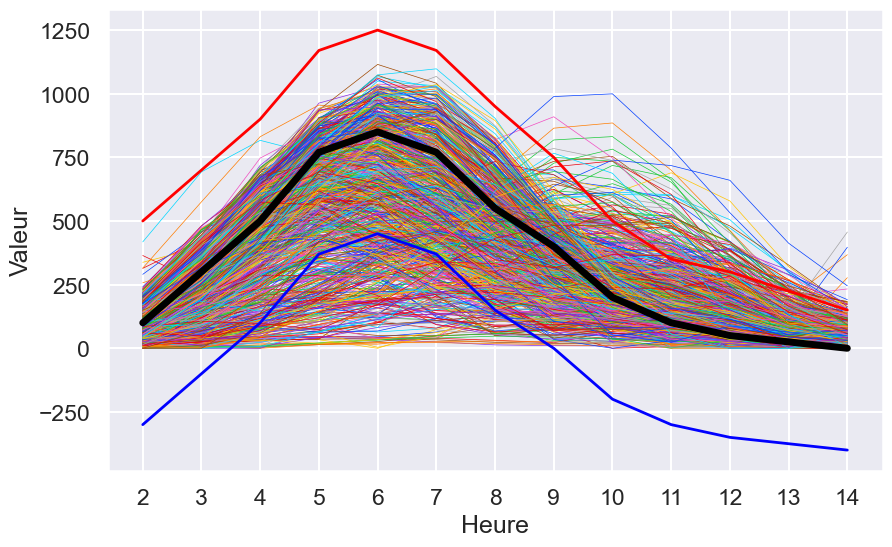

In [363]:
trend_sunny_day_clear_AM = np.array([100, 300, 500, 770, 850, 770, 550, 400, 200, 100, 50, 25, 0])
trend_sunny_day_clear_AM_max = np.array([val+400 for val in trend_sunny_day_clear_AM]) - np.array([0, 0, 0, 0, 0, 0, 0, 50, 100, 150, 150, 200, 250])
trend_sunny_day_clear_AM_min = np.array([val-400 for val in trend_sunny_day_clear_AM])
plt.figure(figsize=(10,6))
for col in df_clear_AM.columns:
    plt.plot(hours, df_clear_AM[col],lw = 0.5)

# Tracer la ligne noire représentant la tendance ensoleillée
plt.plot(hours, trend_sunny_day_clear_AM, lw=5, color='black')
plt.plot(hours, trend_sunny_day_clear_AM_max, lw=2, color='red')
plt.plot(hours, trend_sunny_day_clear_AM_min, lw=2, color='blue')

plt.grid(True)
plt.xticks(hours)
plt.xlabel('Heure')
plt.ylabel('Valeur')
plt.show()

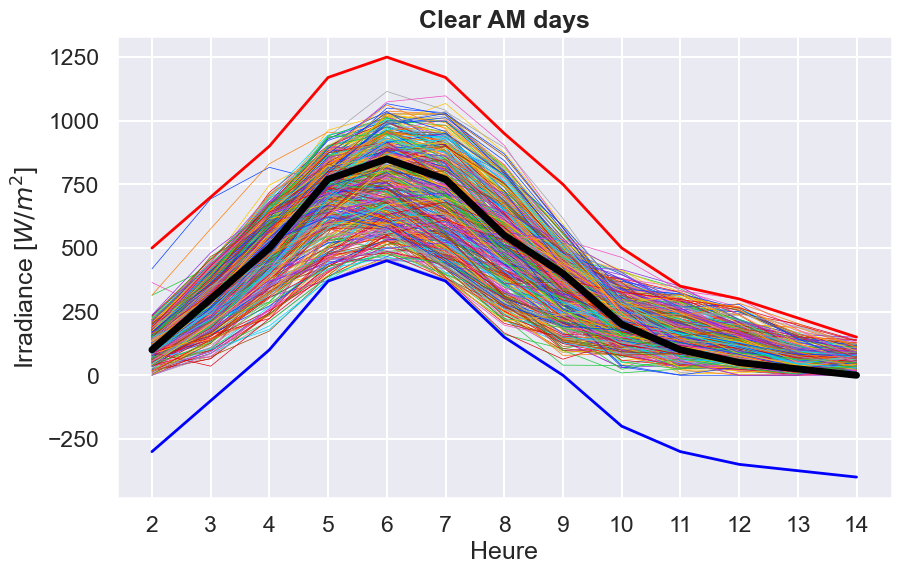

Le nombre de Clear AM day trouvé :  473


In [362]:
hours = list(range(2,15))
trend_sunny_day_clear_AM = np.array([100, 300, 500, 770, 850, 770, 550, 400, 200, 100, 50, 25, 0])
trend_sunny_day_clear_AM_max = np.array([val+400 for val in trend_sunny_day_clear_AM]) - np.array([0, 0, 0, 0, 0, 0, 0, 50, 100, 150, 150, 200, 250])
trend_sunny_day_clear_AM_min = np.array([val-400 for val in trend_sunny_day_clear_AM])

# Liste pour stocker les colonnes (jours) qui passent dans le tube
selected_columns_clear_AM = []

# Parcourir les colonnes de votre DataFrame
for col in df_clear_AM.columns:
    ghi_values = df_clear_AM[col].values
    # Vérifier si toutes les valeurs de ghi_values sont entre les tendances max et min
    if np.all((ghi_values >= trend_sunny_day_clear_AM_min) & (ghi_values <= trend_sunny_day_clear_AM_max)):
        selected_columns_clear_AM.append(col)

df_clear_AM_select = df_clear_AM.loc[:, selected_columns_clear_AM]


plt.figure(figsize=(10,6))
for col in df_clear_AM_select.columns:
    plt.plot(hours, df_clear_AM_select[col],lw = 0.5)

# Tracer la ligne noire représentant la tendance ensoleillée
plt.plot(hours, trend_sunny_day_clear_AM, lw=5, color='black')
plt.plot(hours, trend_sunny_day_clear_AM_max, lw=2, color='red')
plt.plot(hours, trend_sunny_day_clear_AM_min, lw=2, color='blue')



plt.grid(True)
plt.title('Clear AM days',  fontweight='bold')
plt.xticks(hours)
plt.xlabel('Heure')
plt.ylabel('Irradiance [$W/m^2$]')
plt.show()
print('Le nombre de Clear AM day trouvé : ',len(selected_columns_clear_AM))

### Clear PM

In [364]:
df_clear_PM = df_clear_AM.drop(columns=selected_columns_clear_AM)
df_clear_PM

ID_date,9,23,30,34,37,42,48,83,84,85,...,5148,5149,5150,5152,5153,5156,5190,5194,5213,5408
heure,,,,,,,,,,,,,,,,,,,,,
02:00:00,181.181413,139.114729,106.734125,96.774117,125.112027,97.055614,59.660492,38.594911,30.765113,38.714541,...,14.013128,25.323711,0.000000,142.828840,139.773644,130.832118,85.431822,0.000000,48.112307,123.308514
03:00:00,351.405730,316.821401,79.639708,91.354583,286.360819,275.557867,98.639720,117.845145,100.412735,94.901290,...,40.863662,36.877284,68.116514,165.267573,285.414949,289.497898,105.979403,0.000000,192.066441,339.792400
04:00:00,581.981278,542.060983,66.196655,109.883867,528.626719,508.006735,95.323786,211.426338,181.397617,144.720205,...,87.341707,56.691638,206.128638,222.361326,362.166879,424.133921,97.612400,138.006772,419.260788,580.940367
05:00:00,860.750762,821.129460,33.449627,189.972763,798.096156,782.155537,105.057670,328.549220,224.803125,160.909411,...,119.416306,104.750583,332.077702,284.099386,395.550705,439.958933,73.975987,421.068761,655.873054,693.509279
06:00:00,1004.787460,984.824911,0.000000,336.173294,905.474444,1027.355952,181.525175,377.705055,341.826079,232.724373,...,169.717262,159.520230,422.065056,289.315095,338.677857,366.361413,172.198960,588.893868,716.660587,647.574365
07:00:00,956.501746,928.125667,73.779135,430.283865,925.304778,978.190000,343.725746,332.499000,433.426794,274.456500,...,212.696079,220.609206,454.940571,258.870190,302.891587,244.032111,311.152349,645.412048,598.277857,489.430635
08:00:00,751.300794,694.913841,120.851802,489.300873,748.016984,818.802889,587.647667,272.021670,554.394746,289.669944,...,219.607619,241.868159,397.729841,204.343889,308.643365,154.259032,432.361294,562.852460,421.073095,348.119048
09:00:00,484.416984,431.114889,130.799976,590.781667,474.976913,547.696746,750.236159,187.221754,644.889921,279.250492,...,198.809524,223.205968,321.608500,156.878016,354.659079,211.843619,483.571397,482.756349,324.775143,316.420952
10:00:00,261.035635,207.312667,112.530929,604.653095,230.243889,261.821683,734.735238,123.768500,598.050611,236.797016,...,171.087659,169.304056,233.436683,110.135270,272.992778,227.791000,388.056317,481.771111,346.972516,368.038556


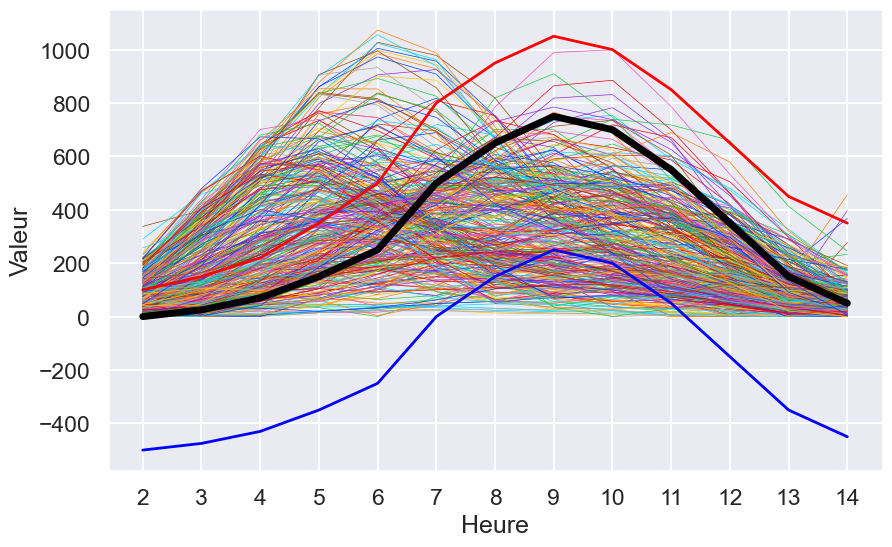

In [370]:
trend_sunny_day_clear_PM = np.array([0, 25, 70, 150, 250, 500, 650, 750, 700, 550, 350, 150, 50])
trend_sunny_day_clear_PM_max = np.array([val+300 for val in trend_sunny_day_clear_PM])- np.array([200, 175, 150, 100, 50, 0, 0, 0, 0, 0, 0, 0, 0])
trend_sunny_day_clear_PM_min = np.array([val-500 for val in trend_sunny_day_clear_PM])
plt.figure(figsize=(10,6))
for col in df_clear_PM.columns:
    plt.plot(hours, df_clear_PM[col],lw = 0.5)

# Tracer la ligne noire représentant la tendance ensoleillée
plt.plot(hours, trend_sunny_day_clear_PM, lw=5, color='black')
plt.plot(hours, trend_sunny_day_clear_PM_max, lw=2, color='red')
plt.plot(hours, trend_sunny_day_clear_PM_min, lw=2, color='blue')

plt.grid(True)
plt.xticks(hours)
plt.xlabel('Heure')
plt.ylabel('Valeur')
plt.show()

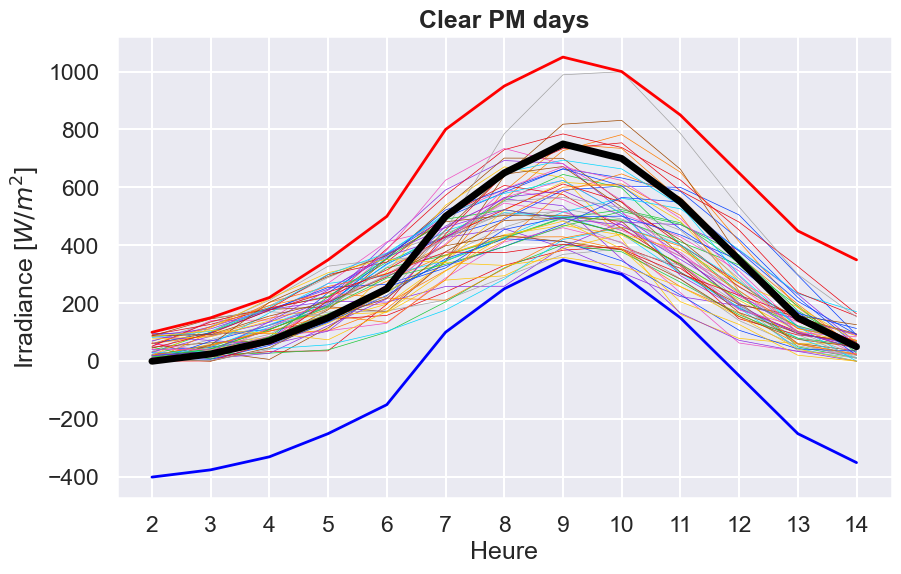

Le nombre de Clear PM day trouvé :  59


In [371]:
hours = list(range(2,15))
trend_sunny_day_clear_PM = np.array([0, 25, 70, 150, 250, 500, 650, 750, 700, 550, 350, 150, 50])
trend_sunny_day_clear_PM_max = np.array([val+300 for val in trend_sunny_day_clear_PM])- np.array([200, 175, 150, 100, 50, 0, 0, 0, 0, 0, 0, 0, 0])
trend_sunny_day_clear_PM_min = np.array([val-400 for val in trend_sunny_day_clear_PM])

# Liste pour stocker les colonnes (jours) qui passent dans le tube
selected_columns_clear_PM = []

# Parcourir les colonnes de votre DataFrame
for col in df_clear_PM.columns:
    ghi_values = df_clear_PM[col].values
    # Vérifier si toutes les valeurs de ghi_values sont entre les tendances max et min
    if np.all((ghi_values >= trend_sunny_day_clear_PM_min) & (ghi_values <= trend_sunny_day_clear_PM_max)):
        selected_columns_clear_PM.append(col)

df_clear_PM_select = df_clear_PM.loc[:, selected_columns_clear_PM]


plt.figure(figsize=(10,6))
for col in df_clear_PM_select.columns:
    plt.plot(hours, df_clear_PM_select[col],lw = 0.5)

# Tracer la ligne noire représentant la tendance ensoleillée
plt.plot(hours, trend_sunny_day_clear_PM, lw=5, color='black')
plt.plot(hours, trend_sunny_day_clear_PM_max, lw=2, color='red')
plt.plot(hours, trend_sunny_day_clear_PM_min, lw=2, color='blue')



plt.grid(True)
plt.title('Clear PM days',  fontweight='bold')
plt.xticks(hours)
plt.xlabel('Heure')
plt.ylabel('Irradiance [$W/m^2$]')
plt.show()
print('Le nombre de Clear PM day trouvé : ',len(selected_columns_clear_PM))

### Overcast day

In [372]:
df_overcast = df_clear_PM.drop(columns=selected_columns_clear_PM)
df_overcast

ID_date,9,23,30,37,42,83,85,86,90,100,...,5147,5148,5149,5150,5152,5153,5156,5194,5213,5408
heure,,,,,,,,,,,,,,,,,,,,,
02:00:00,181.181413,139.114729,106.734125,125.112027,97.055614,38.594911,38.714541,43.025539,15.397755,0.000000,...,121.536027,14.013128,25.323711,0.000000,142.828840,139.773644,130.832118,0.000000,48.112307,123.308514
03:00:00,351.405730,316.821401,79.639708,286.360819,275.557867,117.845145,94.901290,174.733662,26.303586,68.693202,...,249.724851,40.863662,36.877284,68.116514,165.267573,285.414949,289.497898,0.000000,192.066441,339.792400
04:00:00,581.981278,542.060983,66.196655,528.626719,508.006735,211.426338,144.720205,362.620536,35.614277,286.164061,...,394.944084,87.341707,56.691638,206.128638,222.361326,362.166879,424.133921,138.006772,419.260788,580.940367
05:00:00,860.750762,821.129460,33.449627,798.096156,782.155537,328.549220,160.909411,579.383892,44.282075,386.321859,...,472.769870,119.416306,104.750583,332.077702,284.099386,395.550705,439.958933,421.068761,655.873054,693.509279
06:00:00,1004.787460,984.824911,0.000000,905.474444,1027.355952,377.705055,232.724373,602.210744,44.775603,492.082389,...,446.092222,169.717262,159.520230,422.065056,289.315095,338.677857,366.361413,588.893868,716.660587,647.574365
07:00:00,956.501746,928.125667,73.779135,925.304778,978.190000,332.499000,274.456500,519.668618,63.887206,550.650730,...,387.398571,212.696079,220.609206,454.940571,258.870190,302.891587,244.032111,645.412048,598.277857,489.430635
08:00:00,751.300794,694.913841,120.851802,748.016984,818.802889,272.021670,289.669944,438.709060,103.574143,485.588016,...,449.594365,219.607619,241.868159,397.729841,204.343889,308.643365,154.259032,562.852460,421.073095,348.119048
09:00:00,484.416984,431.114889,130.799976,474.976913,547.696746,187.221754,279.250492,386.947698,143.968302,447.601429,...,557.051968,198.809524,223.205968,321.608500,156.878016,354.659079,211.843619,482.756349,324.775143,316.420952
10:00:00,261.035635,207.312667,112.530929,230.243889,261.821683,123.768500,236.797016,366.202063,169.452000,491.660952,...,572.456200,171.087659,169.304056,233.436683,110.135270,272.992778,227.791000,481.771111,346.972516,368.038556


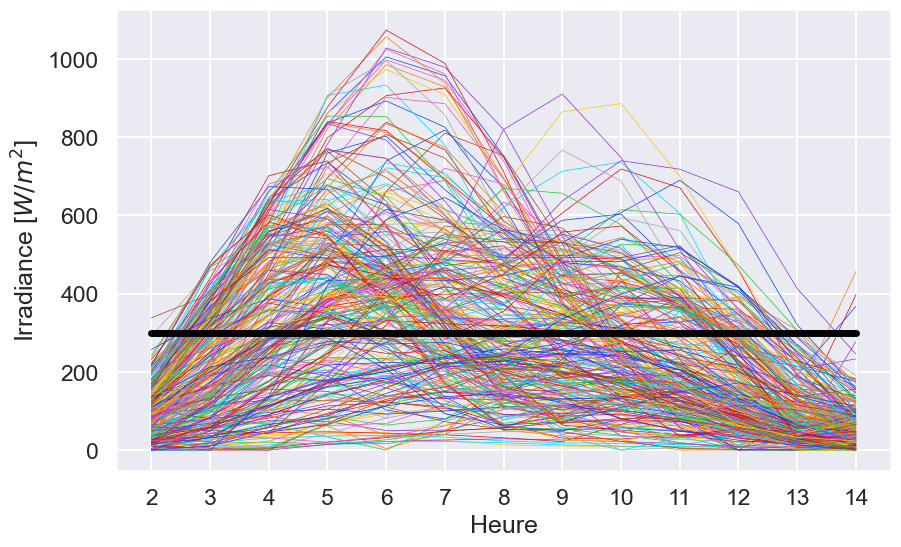

In [373]:
trend_sunny_day_overcast = np.array([300 for i in range(13)])
plt.figure(figsize=(10,6))
for col in df_overcast.columns:
    plt.plot(hours, df_overcast[col],lw = 0.5)

# Tracer la ligne noire représentant la tendance ensoleillée
plt.plot(hours, trend_sunny_day_overcast, lw=5, color='black')


plt.grid(True)
plt.xticks(hours)
plt.xlabel('Heure')
plt.ylabel('Irradiance [$W/m^2$]')
plt.show()


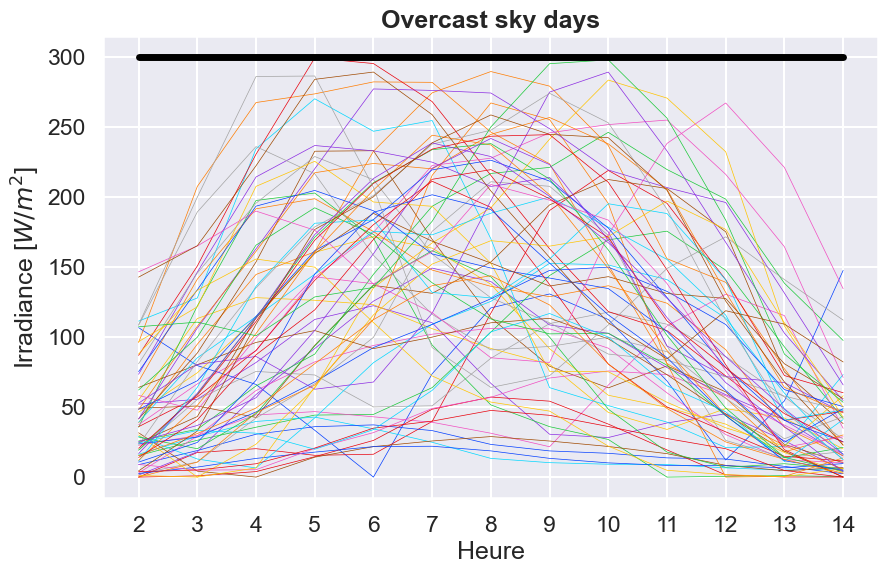

Le nombre de Overcast day trouvé :  66


In [374]:
trend_sunny_day_overcast = np.array([300 for i in range(13)])

# Liste pour stocker les colonnes (jours) qui passent dans le tube
selected_columns_overcast = []

# Parcourir les colonnes de votre DataFrame
for col in df_overcast.columns:
    ghi_values = df_overcast[col].values
    # Vérifier si toutes les valeurs de ghi_values sont entre les tendances max et min
    if np.all((ghi_values <= trend_sunny_day_overcast)):
        selected_columns_overcast.append(col)

df_clear_overcast_select = df_overcast.loc[:, selected_columns_overcast]


plt.figure(figsize=(10,6))
for col in df_clear_overcast_select.columns:
    plt.plot(hours, df_clear_overcast_select[col],lw = 0.5)

# Tracer la ligne noire représentant la tendance ensoleillée
plt.plot(hours, trend_sunny_day_overcast, lw=5, color='black')



plt.grid(True)
plt.title('Overcast sky days',  fontweight='bold')
plt.xticks(hours)
plt.xlabel('Heure')
plt.ylabel('Irradiance [$W/m^2$]')
plt.show()
print('Le nombre de Overcast day trouvé : ',len(selected_columns_overcast))

### Random days

In [375]:
df_random = df_overcast.drop(columns=selected_columns_overcast)
df_random

ID_date,9,23,37,42,83,86,100,288,309,337,...,5098,5116,5124,5147,5150,5153,5156,5194,5213,5408
heure,,,,,,,,,,,,,,,,,,,,,
02:00:00,181.181413,139.114729,125.112027,97.055614,38.594911,43.025539,0.000000,111.804331,105.719190,176.069325,...,183.482429,132.529714,176.486468,121.536027,0.000000,139.773644,130.832118,0.000000,48.112307,123.308514
03:00:00,351.405730,316.821401,286.360819,275.557867,117.845145,174.733662,68.693202,293.546025,315.041079,357.907540,...,415.896937,212.674175,316.503079,249.724851,68.116514,285.414949,289.497898,0.000000,192.066441,339.792400
04:00:00,581.981278,542.060983,528.626719,508.006735,211.426338,362.620536,286.164061,534.460095,629.124690,459.931032,...,574.134246,237.240198,412.057587,394.944084,206.128638,362.166879,424.133921,138.006772,419.260788,580.940367
05:00:00,860.750762,821.129460,798.096156,782.155537,328.549220,579.383892,386.321859,676.397845,835.781397,433.386111,...,562.475159,277.708127,440.106143,472.769870,332.077702,395.550705,439.958933,421.068761,655.873054,693.509279
06:00:00,1004.787460,984.824911,905.474444,1027.355952,377.705055,602.210744,492.082389,627.172931,811.176905,285.481667,...,445.929921,270.693659,348.607357,446.092222,422.065056,338.677857,366.361413,588.893868,716.660587,647.574365
07:00:00,956.501746,928.125667,925.304778,978.190000,332.499000,519.668618,550.650730,455.343707,701.956825,147.496508,...,341.679286,275.273159,230.765008,387.398571,454.940571,302.891587,244.032111,645.412048,598.277857,489.430635
08:00:00,751.300794,694.913841,748.016984,818.802889,272.021670,438.709060,485.588016,334.977708,574.085952,149.584127,...,298.035635,242.135706,130.155032,449.594365,397.729841,308.643365,154.259032,562.852460,421.073095,348.119048
09:00:00,484.416984,431.114889,474.976913,547.696746,187.221754,386.947698,447.601429,336.969188,504.902698,184.739238,...,447.767540,334.596381,56.805825,557.051968,321.608500,354.659079,211.843619,482.756349,324.775143,316.420952
10:00:00,261.035635,207.312667,230.243889,261.821683,123.768500,366.202063,491.660952,392.237037,542.492921,199.310778,...,544.078825,399.009921,46.813167,572.456200,233.436683,272.992778,227.791000,481.771111,346.972516,368.038556


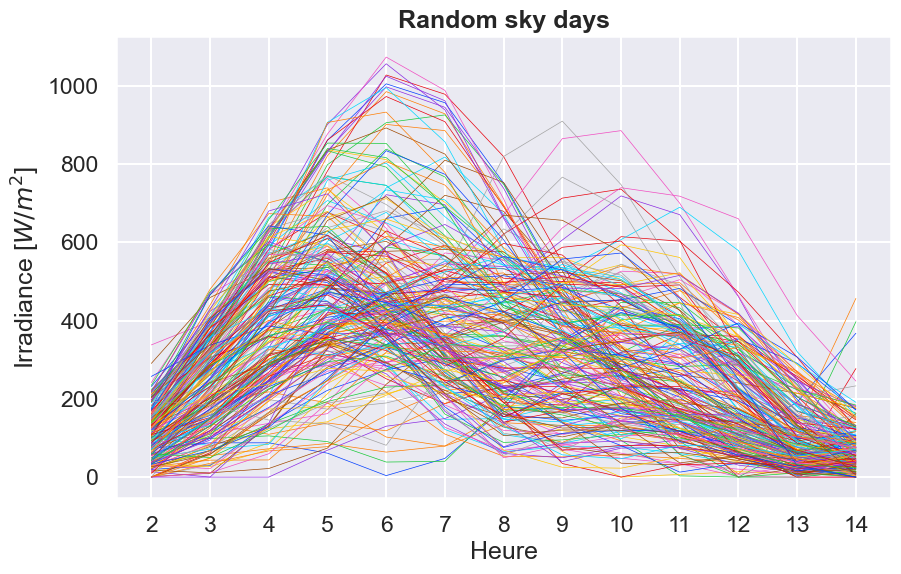

Le nombre de Random day trouvé :  227


In [376]:
plt.figure(figsize=(10,6))
for col in df_random.columns:
    plt.plot(hours, df_random[col],lw = 0.5)


plt.grid(True)
plt.title('Random sky days',  fontweight='bold')
plt.xticks(hours)
plt.xlabel('Heure')
plt.ylabel('Irradiance [$W/m^2$]')
plt.show()
print('Le nombre de Random day trouvé : ',df_random.shape[1])

In [165]:
mydf2.columns

Index([   1,    2,    3,    4,    5,    6,    7,    8,    9,   10,
       ...
       5402, 5403, 5404, 5405, 5406, 5407, 5408, 5409, 5410, 5411],
      dtype='int64', name='ID_date', length=2436)

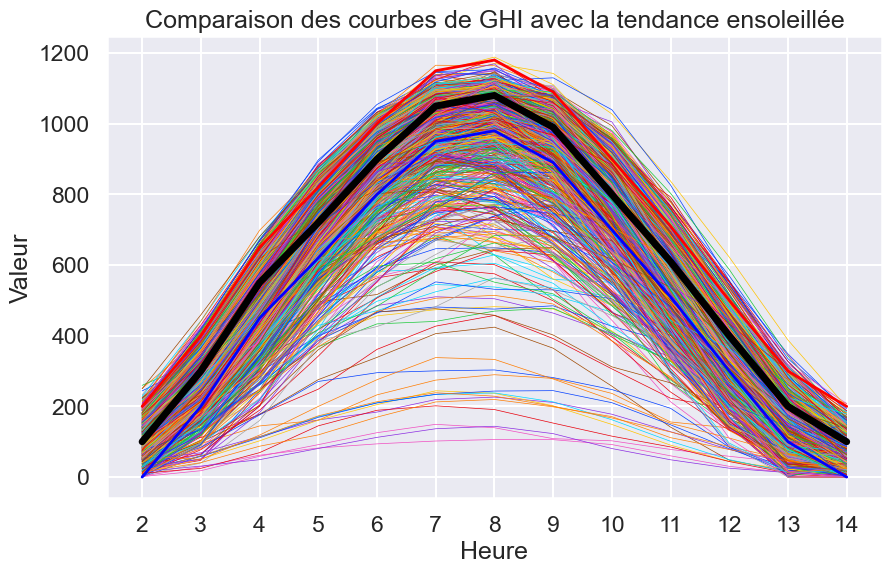

In [155]:
trend_sunny_day_summer = np.array([100, 300, 550, 720, 900, 1050, 1080, 990, 800, 610, 400, 200, 100])
trend_sunny_day_summer_max = np.array([val+100 for val in trend_sunny_day_summer])
trend_sunny_day_summer_min = np.array([val-100 for val in trend_sunny_day_summer])
# Seuil de corrélation pour considérer une journée comme ensoleillée
threshold = 0.97

# Liste pour stocker les colonnes (jours) qui passent dans le tube
selected_columns = []

plt.figure(figsize=(10, 6))
for col in mydf2.columns:
    ghi_values = mydf2[col].values
    correlation = np.corrcoef(ghi_values, trend_sunny_day_summer)[0, 1] # Pearson coef
    if correlation > threshold:
        plt.plot(hours, ghi_values, lw=0.5)
        selected_columns.append(col)

# Tracer la ligne noire représentant la tendance ensoleillée
plt.plot(hours, trend_sunny_day_summer, lw=5, color='black')
plt.plot(hours, trend_sunny_day_summer_max, lw=2, color='red')
plt.plot(hours, trend_sunny_day_summer_min, lw=2, color='blue')

plt.grid(True)
plt.xticks(hours)
plt.xlabel('Heure')
plt.ylabel('Valeur')
plt.title('Comparaison des courbes de GHI avec la tendance ensoleillée')
#plt.legend(selected_columns, title='Colonnes sélectionnées')
plt.show()

In [153]:
trend_sunny_day_summer_max

array([ 200,  400,  650,  820, 1000, 1150, 1180, 1090,  900,  710,  500,
        300,  200])

In [133]:
# Exemple de tendance pour une journée ensoleillée (à ajuster selon vos données réelles)
trend_sunny_day_summer = np.array([100, 300, 550, 720, 900, 1050, 1080, 990, 800, 610, 400, 200, 100])
trend_sunny_day_summer

array([ 100,  300,  550,  720,  900, 1050, 1080,  990,  800,  610,  400,
        200,  100])

Jours ensoleillés:
[5, 6, 7, 16, 17, 33, 36, 41, 79, 80, 87, 88, 93, 95, 96, 97, 98, 99, 290, 291, 292, 293, 295, 299, 302, 303, 304, 307, 308, 310, 311, 312, 313, 314, 315, 316, 317, 318, 320, 324, 325, 328, 329, 330, 331, 332, 336, 339, 340, 341, 342, 343, 344, 345, 348, 349, 351, 357, 358, 363, 364, 375, 376, 377, 378, 387, 388, 389, 390, 394, 395, 397, 398, 400, 401, 402, 405, 406, 407, 409, 410, 413, 414, 417, 418, 419, 423, 424, 425, 428, 432, 435, 436, 445, 447, 449, 452, 455, 457, 458, 460, 461, 462, 463, 465, 466, 467, 651, 652, 653, 654, 656, 657, 658, 659, 663, 664, 665, 668, 669, 670, 671, 672, 673, 675, 677, 686, 688, 691, 692, 693, 694, 695, 700, 702, 703, 705, 707, 708, 727, 730, 731, 732, 733, 735, 739, 740, 741, 742, 761, 762, 768, 774, 776, 777, 778, 779, 782, 786, 789, 790, 793, 794, 795, 797, 798, 800, 801, 802, 803, 808, 809, 810, 812, 813, 815, 820, 822, 823, 824, 826, 827, 830, 832, 1017, 1018, 1020, 1021, 1025, 1026, 1027, 1030, 1031, 1032, 1033, 1039, 1040, 104

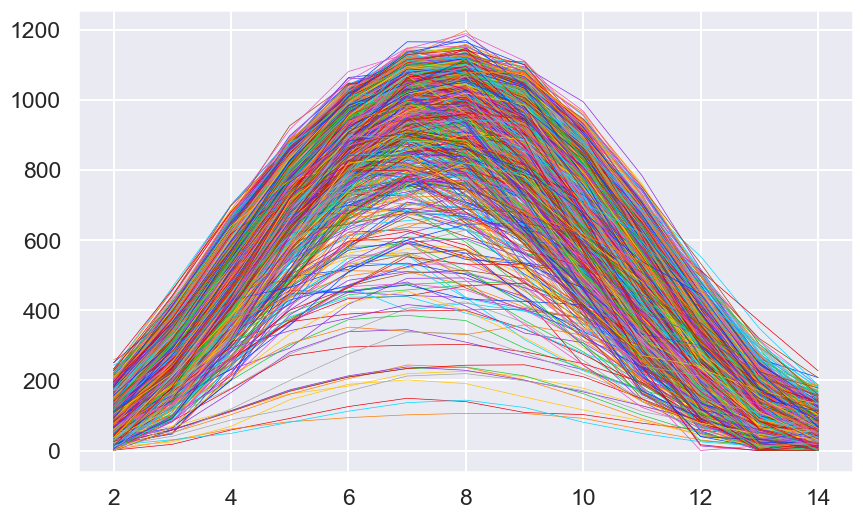

In [139]:
from scipy.stats import pearsonr
# Seuil de corrélation pour considérer une journée comme ensoleillée
threshold = 0.95

# Liste pour stocker les jours ensoleillés
sunny_days = []

# Comparer chaque jour (colonne) avec la tendance
for column in mydf2.columns:
    day_values = mydf2[column].dropna().values
    if len(day_values) == len(trend_sunny_day_summer):  # Assurez-vous que les longueurs correspondent
        correlation, _ = pearsonr(day_values, trend_sunny_day)
        if correlation > threshold:
            sunny_days.append(column)

print("Jours ensoleillés:")
print(sunny_days)
len(sunny_days)

df_sun_days = mydf2.loc[:, sunny_days]


plt.figure(figsize=(10,6))
for col in df_sun_days.columns:
    plt.plot(hours, df_sun_days[col],lw = 0.5)

In [103]:
df_sun_days = mydf2.loc[:, sunny_days]
df_sun_days

ID_date,5,40,41,76,77,80,87,91,93,94,...,5148,5159,5166,5178,5181,5199,5207,5210,5215,5399
heure,,,,,,,,,,,,,,,,,,,,,
02:00:00,130.476333,135.102540,99.864687,26.180389,74.643973,0.000000,66.249544,61.079405,17.722713,54.375334,...,14.013128,125.151098,39.528244,75.475452,97.323074,97.664347,67.538659,41.676245,30.750937,92.245784
03:00:00,339.198746,283.462079,263.227340,163.126786,211.438856,123.306213,176.012024,186.753214,152.085868,146.438379,...,40.863662,258.283533,172.211035,230.279986,242.151963,213.303568,203.831135,77.530587,166.747571,290.615162
04:00:00,581.738675,507.866000,502.567400,399.512992,428.067511,348.457960,384.901845,360.531317,362.985192,301.783523,...,87.341707,449.836441,417.366375,450.145564,459.967267,433.133153,424.377373,254.027696,367.815849,524.641708
05:00:00,815.697365,747.901952,741.803400,664.212754,656.982408,614.400733,595.107183,582.629595,616.342129,521.155297,...,119.416306,671.750600,686.194089,699.070179,697.995049,680.152705,653.518405,491.046248,599.296921,748.076771
06:00:00,972.576349,931.915476,949.934841,863.726429,835.797333,856.976222,794.943016,771.388984,815.609794,738.698016,...,169.717262,861.472619,917.576476,897.074841,881.712302,874.599730,835.578651,669.725111,794.519127,920.117857
07:00:00,1072.289762,1058.880159,1063.044762,937.629762,966.826746,1018.183571,933.341667,911.420238,905.179921,892.844921,...,212.696079,1015.161349,1057.556190,1025.715079,998.672698,985.538810,947.826429,810.797937,913.322937,1018.466032
08:00:00,1091.322302,1110.972222,1103.201905,973.870635,1019.438413,1053.855952,926.880238,987.325079,960.205000,1031.679206,...,219.607619,1080.250159,1105.745317,1079.284762,1077.472540,1012.844841,999.797619,926.833651,945.037540,1056.758968
09:00:00,1041.780000,1092.787698,1067.361508,940.511032,987.495079,966.564365,831.322857,959.234524,865.714683,962.433095,...,198.809524,1081.731190,1041.406270,1057.936032,1078.010952,967.553254,939.415317,853.120921,932.699254,974.472143
10:00:00,922.746413,977.520556,925.415746,848.830698,880.986857,782.971254,683.165635,826.322556,685.216333,745.810746,...,171.087659,945.263016,892.952222,952.629762,888.015556,884.090238,807.661413,754.447897,777.892317,840.145127


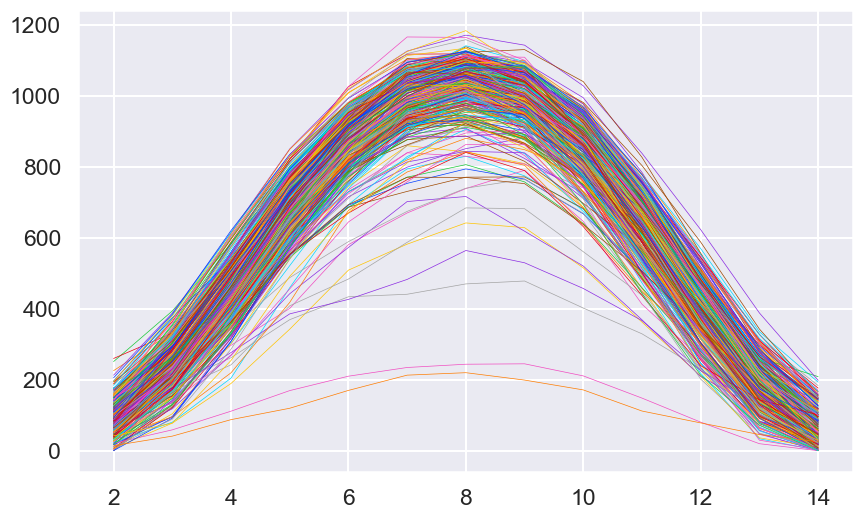

In [104]:
plt.figure(figsize=(10,6))
for col in df_sun_days.columns:
    plt.plot(hours, df_sun_days[col],lw = 0.5)

# Généralisation

Le nombre de valeurs NaN avant la sélection : 34965
Le nombre de valeurs NaN après la sélection : 4165
Index(['ghi', 'ghi_smoothed'], dtype='object')
                timestamp         ghi  ghi_smoothed       date     heure  \
0     2016-10-01 02:00:00   31.406233    108.258435 2016-10-01  02:00:00   
1     2016-10-01 03:00:00  314.370333    281.540019 2016-10-01  03:00:00   
2     2016-10-01 04:00:00  584.280000    522.240351 2016-10-01  04:00:00   
3     2016-10-01 05:00:00  655.191667    696.492629 2016-10-01  05:00:00   
4     2016-10-01 06:00:00  866.073333    843.497349 2016-10-01  06:00:00   
...                   ...         ...           ...        ...       ...   
17593 2024-03-31 10:00:00  279.635000    298.387048 2024-03-31  10:00:00   
17594 2024-03-31 11:00:00  173.706667    228.192762 2024-03-31  11:00:00   
17595 2024-03-31 12:00:00  159.886667    106.073324 2024-03-31  12:00:00   
17596 2024-03-31 13:00:00   53.146000     60.239149 2024-03-31  13:00:00   
17597 2024-03-

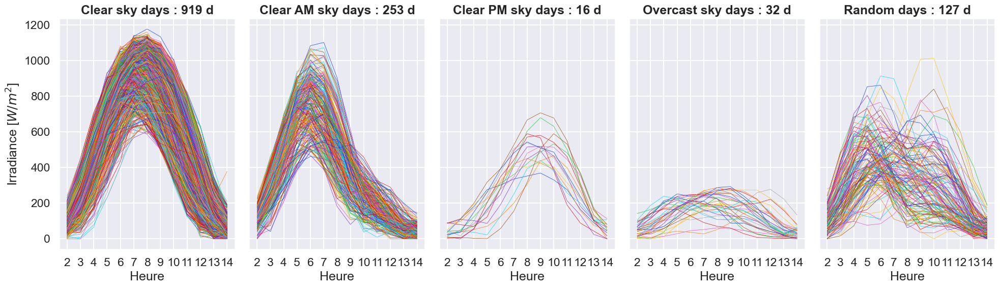

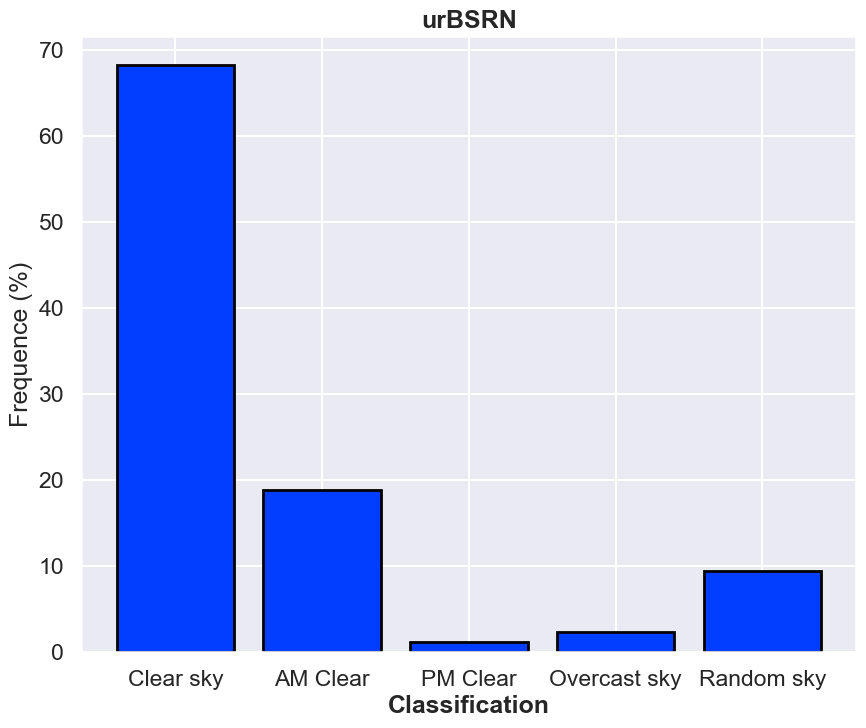

In [42]:
data_irrad = df_BSRN
def classification_summer_data(data_irrad,variable,name_station):
    df = data_irrad.copy()
    df_1 = hourly_mean(df)
    df_filter = Savitzky_Golay_filter(df_1, variable, 7 , 2)
    print(df_filter.columns)
    df_summer = df_filter[df_filter.index.month.isin([10, 11, 12, 1, 2,3])]
    df_summer_form = formalisation_data(df_summer)
    print(df_summer_form)
    mydf_1 = df_summer_form.pivot_table(values=variable+'_smoothed',index='heure',columns='ID_date')
    mydf2 = mydf_1.dropna(axis=1, how='any')

    nb_tot_day = mydf2.shape[1]
    print('Nombre de journée valide à l''analyse :',nb_tot_day)

    # sunny days __________________________________________________________________________________
    trend_sunny_day= np.array([100, 300, 550, 720, 900, 1050, 1080, 990, 800, 610, 400, 200, 100])
    trend_sunny_day_max = np.array([val+500 for val in trend_sunny_day])
    trend_sunny_day_min = np.array([val-500 for val in trend_sunny_day])
    # Liste pour stocker les colonnes (jours) qui passent dans le tube
    selected_columns_sun_day = []
    # Parcourir les colonnes de votre DataFrame
    for col in mydf2.columns:
        ghi_values = mydf2[col].values
        # Vérifier si toutes les valeurs de ghi_values sont entre les tendances max et min
        if np.all((ghi_values >= trend_sunny_day_min) & (ghi_values <= trend_sunny_day_max)):
            selected_columns_sun_day.append(col)
    df_sun_days = mydf2.loc[:, selected_columns_sun_day]
    nb_sun_day = len(selected_columns_sun_day)

    
    # Clear AM __________________________________________________________________________________
    df_clear_AM = mydf2.drop(columns=selected_columns_sun_day)
    trend_sunny_day_clear_AM = np.array([100, 300, 500, 770, 850, 770, 550, 400, 200, 100, 50, 25, 0])
    trend_sunny_day_clear_AM_max = np.array([val+400 for val in trend_sunny_day_clear_AM]) - np.array([0, 0, 0, 0, 0, 0, 0, 50, 100, 150, 150, 200, 250])
    trend_sunny_day_clear_AM_min = np.array([val-400 for val in trend_sunny_day_clear_AM])
    # Liste pour stocker les colonnes (jours) qui passent dans le tube
    selected_columns_clear_AM = []
    # Parcourir les colonnes de votre DataFrame
    for col in df_clear_AM.columns:
        ghi_values = df_clear_AM[col].values
        # Vérifier si toutes les valeurs de ghi_values sont entre les tendances max et min
        if np.all((ghi_values >= trend_sunny_day_clear_AM_min) & (ghi_values <= trend_sunny_day_clear_AM_max)):
            selected_columns_clear_AM.append(col)
    df_clear_AM_select = df_clear_AM.loc[:, selected_columns_clear_AM]
    nb_clear_AM_day = len(selected_columns_clear_AM)

    # Clear PM  __________________________________________________________________________________
    df_clear_PM = df_clear_AM.drop(columns=selected_columns_clear_AM)
    trend_sunny_day_clear_PM = np.array([0, 25, 70, 150, 250, 500, 650, 750, 700, 550, 350, 150, 50])
    trend_sunny_day_clear_PM_max = np.array([val+300 for val in trend_sunny_day_clear_PM])- np.array([200, 175, 150, 100, 50, 0, 0, 0, 0, 0, 0, 0, 0])
    trend_sunny_day_clear_PM_min = np.array([val-400 for val in trend_sunny_day_clear_PM])
    # Liste pour stocker les colonnes (jours) qui passent dans le tube
    selected_columns_clear_PM = []
    # Parcourir les colonnes de votre DataFrame
    for col in df_clear_PM.columns:
        ghi_values = df_clear_PM[col].values
        # Vérifier si toutes les valeurs de ghi_values sont entre les tendances max et min
        if np.all((ghi_values >= trend_sunny_day_clear_PM_min) & (ghi_values <= trend_sunny_day_clear_PM_max)):
            selected_columns_clear_PM.append(col)
    df_clear_PM_select = df_clear_PM.loc[:, selected_columns_clear_PM]
    nb_clear_PM_day = len(selected_columns_clear_PM)

    # Overcast  __________________________________________________________________________________
    df_overcast = df_clear_PM.drop(columns=selected_columns_clear_PM)
    trend_sunny_day_overcast = np.array([300 for i in range(13)])
    # Liste pour stocker les colonnes (jours) qui passent dans le tube
    selected_columns_overcast = []
    # Parcourir les colonnes de votre DataFrame
    for col in df_overcast.columns:
        ghi_values = df_overcast[col].values
        # Vérifier si toutes les valeurs de ghi_values sont entre les tendances max et min
        if np.all((ghi_values <= trend_sunny_day_overcast)):
            selected_columns_overcast.append(col)
    df_clear_overcast_select = df_overcast.loc[:, selected_columns_overcast]
    nb_overcast_day = len(selected_columns_overcast)

    # Random  __________________________________________________________________________________
    df_random = df_overcast.drop(columns=selected_columns_overcast)
    nb_ramdom_day = df_random.shape[1]


    hours = list(range(2,15))
    # Créer une figure et des sous-graphiques (1 ligne, 5 colonnes)
    fig, axes = plt.subplots(1, 5, figsize=(20, 6),sharey=True)

    # Tracer les données sur chaque sous-graphe
    for col in df_sun_days.columns:
        axes[0].plot(hours, df_sun_days[col],lw = 0.5)
    axes[0].set_title(f'Clear sky days : {len(selected_columns_sun_day)} d',  fontweight='bold')
    axes[0].set_xticks(hours)
    axes[0].set_xlabel('Heure')
    axes[0].set_ylabel('Irradiance [$W/m^2$]')


    for col in df_clear_AM_select.columns:
        axes[1].plot(hours, df_clear_AM_select[col],lw = 0.5)
    axes[1].set_title(f'Clear AM sky days : {len(selected_columns_clear_AM)} d',  fontweight='bold')
    axes[1].set_xticks(hours)
    axes[1].set_xlabel('Heure')

    for col in df_clear_PM_select.columns:
        axes[2].plot(hours, df_clear_PM_select[col],lw = 0.5)
    axes[2].set_title(f'Clear PM sky days : {len(selected_columns_clear_PM)} d',  fontweight='bold')
    axes[2].set_xticks(hours)
    axes[2].set_xlabel('Heure')

    for col in df_clear_overcast_select.columns:
        axes[3].plot(hours, df_clear_overcast_select[col],lw = 0.5)
    axes[3].set_title(f'Overcast sky days : {len(selected_columns_overcast)} d',  fontweight='bold')
    axes[3].set_xticks(hours)
    axes[3].set_xlabel('Heure')

    for col in df_random.columns:
        axes[4].plot(hours, df_random[col],lw = 0.5)
    axes[4].set_title(f'Random days : {df_random.shape[1]} d',  fontweight='bold')
    axes[4].set_xticks(hours)
    axes[4].set_xlabel('Heure')
    
    # Ajuster l'espacement entre les sous-graphiques
    plt.tight_layout()
    
    # Afficher la figure
    plt.show()

    liste_freq = [nb_sun_day/nb_tot_day*100,
                  nb_clear_AM_day/nb_tot_day*100,
                  nb_clear_PM_day/nb_tot_day*100,
                  nb_overcast_day/nb_tot_day*100,
                  nb_ramdom_day/nb_tot_day*100]
    liste_class = ['Clear sky','AM Clear','PM Clear','Overcast sky','Random sky']

    plt.figure(figsize=(10,8))

    plt.bar(liste_class,liste_freq,edgecolor = 'black', linewidth = 2)
    plt.xlabel('Classification',fontweight='bold')
    plt.ylabel('Frequence (%)')
    #plt.xticks(liste_class)
    plt.title(f'{name_station}',fontweight='bold')
    plt.show()
                  
    return df_sun_days, df_clear_AM_select, df_clear_PM_select, df_clear_overcast_select,df_random

df_sun_days_ios_net, df_clear_AM_select_ios_net, df_clear_PM_select_ios_net, df_clear_overcast_select_ios_net,df_random_ios_net = classification_summer_data(data_irrad,'ghi','urBSRN')

In [ ]:
df_sun_days_ios_net, df_clear_AM_select_ios_net, df_clear_PM_select_ios_net, df_clear_overcast_select_ios_net,df_random_ios_net

In [40]:
df_sun_days_ios_net

ID_date,1,2,4,5,13,14,15,16,17,19,...,2725,2726,2727,2728,2729,2730,2731,2732,2734,2737
heure,,,,,,,,,,,,,,,,,,,,,
02:00:00,108.258435,109.858442,62.849334,113.755348,148.353817,134.059357,139.928143,145.034238,151.267730,154.219627,...,53.144251,81.621429,54.075325,74.387073,70.399049,41.765304,28.411064,51.961113,60.321141,0.000000
03:00:00,281.540019,315.960465,220.289178,312.001811,344.679175,347.977556,324.511746,326.321127,356.365937,361.516159,...,229.699832,233.904937,216.755444,205.664275,213.592242,218.010582,157.962054,187.290371,203.490637,100.125753
04:00:00,522.240351,563.421709,387.553838,557.100572,591.038968,610.309016,468.814389,576.471794,602.390024,611.671024,...,451.097979,451.879159,434.104325,417.120610,426.519490,434.193053,367.606714,387.865559,411.138425,251.531308
05:00:00,696.492629,792.683887,536.740370,782.146576,814.164048,870.845444,586.006571,849.429889,826.334746,835.512175,...,686.104337,602.455190,673.050635,654.375205,655.942078,663.862779,604.364559,617.385501,624.300317,419.814424
06:00:00,843.497349,957.343413,652.266794,935.085476,963.829603,913.655000,707.847937,959.128730,976.837857,971.711587,...,868.570952,723.682222,833.669127,832.203040,832.744095,839.239127,789.453254,801.342063,782.226302,610.032238
07:00:00,845.147302,1011.464206,713.336429,1014.466349,1047.305317,927.806667,739.269127,936.877857,1055.277937,1002.113413,...,962.198810,820.855000,939.083968,964.608333,944.164286,948.655476,886.635000,906.321746,812.380952,703.700476
08:00:00,798.109286,988.751429,779.647937,1024.550714,1055.572063,784.212540,784.752937,771.742619,1059.434921,866.903810,...,989.824365,881.016825,1003.890635,960.659921,985.766984,986.334841,823.947937,941.893492,722.492222,656.527302
09:00:00,691.182937,914.639762,793.150794,977.714524,927.524762,656.803810,784.630794,555.767540,999.890556,695.454683,...,944.795079,910.588492,938.735079,844.044921,948.907857,938.615873,668.737540,875.569524,586.149048,589.111460
10:00:00,596.582365,800.737952,711.674952,852.531381,723.586111,580.077175,654.986270,361.748270,835.523667,543.352444,...,779.371857,859.715841,796.819127,642.162587,844.362651,788.752159,484.004333,745.866254,454.971254,444.401929


Le nombre de valeurs NaN avant la sélection : 61787
Le nombre de valeurs NaN après la sélection : 187
Index(['SIS_SARAH_3', 'SIS_SARAH_3_smoothed'], dtype='object')
                timestamp  SIS_SARAH_3  SIS_SARAH_3_smoothed       date  \
0     2008-12-01 02:00:00    11.999992              0.000000 2008-12-01   
1     2008-12-01 03:00:00    45.999870            157.782801 2008-12-01   
2     2008-12-01 04:00:00   289.492355            347.530457 2008-12-01   
3     2008-12-01 05:00:00   502.493640            490.731955 2008-12-01   
4     2008-12-01 06:00:00   660.495100            632.613935 2008-12-01   
...                   ...          ...                   ...        ...   
37025 2024-03-31 10:00:00   255.001680            343.166401 2024-03-31   
37026 2024-03-31 11:00:00   219.499505            213.071089 2024-03-31   
37027 2024-03-31 12:00:00   100.998954             80.619049 2024-03-31   
37028 2024-03-31 13:00:00    16.000038             38.070945 2024-03-31   
37029 2024

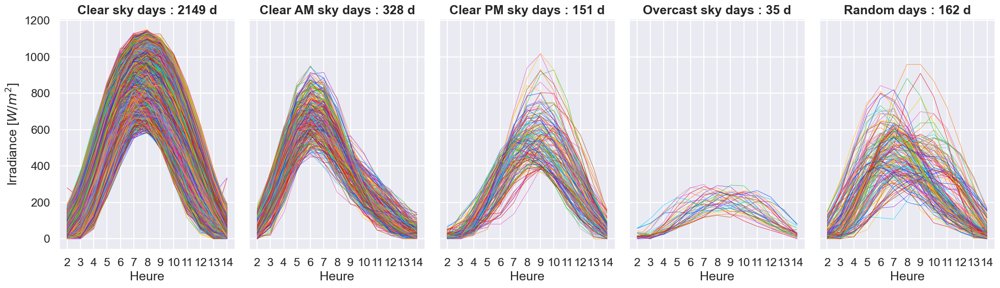

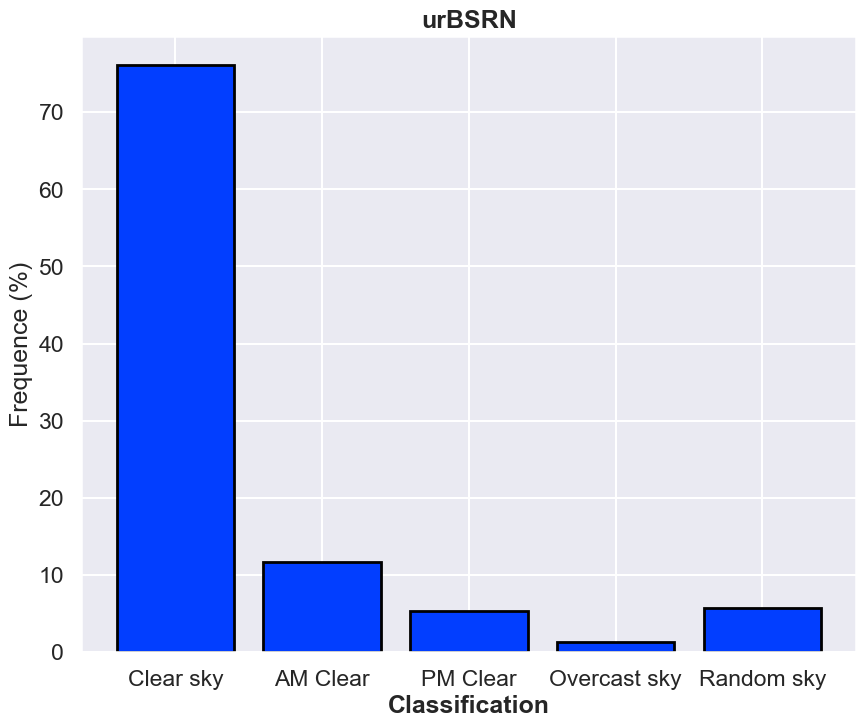

In [43]:
df_sun_days, df_clear_AM_select, df_clear_PM_select, df_clear_overcast_select,df_random = classification_summer_data(df_sarah_GHI,'SIS_SARAH_3','urBSRN')

In [41]:
df_sun_days

ID_date,2,5,6,7,8,10,14,15,16,17,...,5587,5588,5589,5590,5591,5592,5593,5595,5596,5598
heure,,,,,,,,,,,,,,,,,,,,,
02:00:00,160.904139,190.307859,170.380267,122.925842,92.190561,2.094370,101.520658,0.000000,155.449362,166.256852,...,40.523524,49.499697,47.094658,36.309594,18.094497,30.451677,39.690062,30.761508,0.000000,0.000000
03:00:00,322.118452,362.997706,365.450267,289.400533,218.833877,75.476363,266.424466,53.143261,299.162021,291.590046,...,158.167124,172.452304,156.666167,161.618897,122.022882,133.665529,127.666138,125.142439,23.499940,18.833442
04:00:00,515.879172,619.331160,575.284741,468.188137,405.811815,235.882474,502.544012,282.880563,521.043049,539.233471,...,361.118654,392.856890,367.951504,376.499567,333.189465,340.926364,321.570512,316.689893,170.118708,137.666674
05:00:00,680.830923,841.117772,792.547363,547.262337,586.313470,451.955231,739.616962,596.331826,761.758067,786.497094,...,536.070858,629.927704,600.951187,618.141894,583.951463,567.164443,553.998781,524.308405,373.618555,340.261842
06:00:00,774.805010,977.214315,952.380826,579.336516,735.743271,679.265517,880.429966,879.283639,892.332064,970.618518,...,698.689131,773.832209,785.760389,814.950518,809.761466,751.546335,768.117908,696.355768,573.332985,538.261901
07:00:00,822.016866,1027.356999,1044.760557,613.122300,833.861066,845.550538,915.550858,1059.854487,920.547813,1077.928653,...,809.093474,848.450300,905.260335,929.806877,947.785277,866.877946,907.785010,790.045279,691.809317,662.738291
08:00:00,805.181910,957.786513,1069.615736,639.286969,850.097487,859.047901,790.410789,1049.140676,846.311141,1100.189886,...,889.759958,813.901716,905.784075,960.592770,991.760729,839.852672,959.975374,760.402375,689.404696,663.000115
09:00:00,737.918616,812.312325,1044.209264,667.976120,816.357827,699.260493,588.864987,997.141114,694.789458,1044.904257,...,932.784609,737.544837,831.380279,922.283075,955.022077,689.590056,910.046849,678.474517,660.689554,581.810038
10:00:00,579.658210,645.812962,902.328680,630.808953,745.761460,462.165179,372.651856,907.259687,467.649497,916.642800,...,867.212709,629.807063,690.523493,782.426050,822.783852,461.780661,783.070565,575.284680,556.998659,461.309715


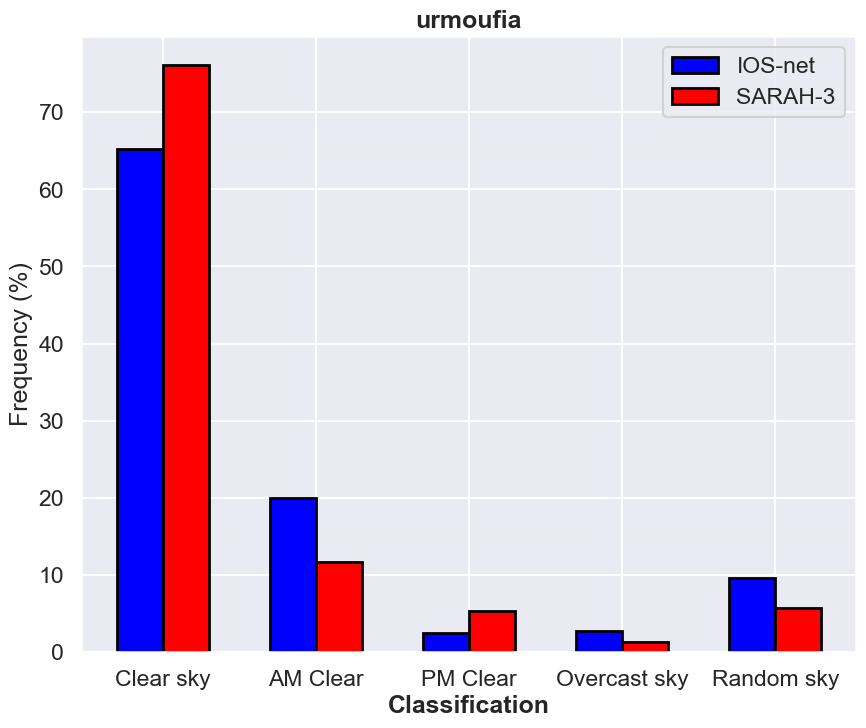

In [33]:
list_IOS_net = liste_freq_urmoufia_ios_net
list_SARAH = liste_freq_urmoufia_sarah
list_class = ['Clear sky','AM Clear','PM Clear','Overcast sky','Random sky']
name_station = 'urmoufia'

def compare_freq(list_IOS_net, list_SARAH, list_class, name_station):
    plt.figure(figsize=(10, 8))
    
    # Bar positions
    bar_width = 0.3
    bar1 = range(len(list_class))
    bar2 = [i + bar_width for i in bar1]

    # Plot bars
    plt.bar(bar1, list_IOS_net, width=bar_width, color='blue', edgecolor='black', linewidth=2, label='IOS-net')
    plt.bar(bar2, list_SARAH, width=bar_width, color='red', edgecolor='black', linewidth=2, label='SARAH-3')
    
    # Labels and title
    plt.xlabel('Classification', fontweight='bold')
    plt.ylabel('Frequency (%)')
    plt.xticks([r + bar_width/2 for r in range(len(list_class))], list_class)
    plt.title(f'{name_station}', fontweight='bold')
    plt.legend(loc='best')
    
    # Show plot
    plt.show()

# Call the function
compare_freq(list_IOS_net, list_SARAH, list_class, name_station)

In [80]:
def selection_same_temporal_data(data_ios,data_sarah):
    """
    This function permit to select the same temporal resolution between two data

    Args :
        data_ios (DataFrame) : pandas DataFrame of IOS-net data
        data_sarah (DataFrame) : pandas DataFrame of SARAH-3 data

    Returns :
        new_ios_data : selective data of IOS-net data
        new_sarah_data : selective data of SARAH-3 data

    Example : 
        data_ios = pd.read_csv('data_urmoufia/data_UTC/BSRN_data_2016_08_01_to_2024_04_01.csv', sep=';', index_col=0)
        data_sarah = pd.read_csv('data_urmoufia/data_UTC/SARAH_3_SIS_moufia.csv', sep=';', index_col=0)
    """

    df_1  = data_ios.copy()
    df_2  = data_sarah.copy()
    
    # Trouver les index minimum et maximum pour chaque DataFrame
    min_index_df_1 = df_1.index.min()
    max_index_df_1 = df_1.index.max()
    
    min_index_df_2 = df_2.index.min()
    max_index_df_2 = df_2.index.max()
    
    # Trouver les index minimum et maximum globaux
    min_index_global = max(min_index_df_1, min_index_df_2)
    max_index_global = min(max_index_df_1, max_index_df_2)

    print('index min : ',min_index_global)
    print('index max : ',max_index_global)

    new_ios_data = df_1[min_index_global:max_index_global]
    new_sarah_data = df_2[min_index_global:max_index_global]
    
    return new_ios_data,new_sarah_data

    

In [73]:
new_ios_data,new_sarah_data = selection_same_temporal_data(df_BSRN,df_sarah_GHI)

index min :  2016-08-01 02:00:00
index max :  2024-04-01 23:00:00


In [77]:
hourly_mean(new_ios_data)

,ghi,dhi,dni_ground,SZA,extra_radiation,mu0,dni,physical_limit_ghi,physical_limit_dhi,physical_limit_dni
2016-08-01 02:00:00,NaN,NaN,NaN,95.178353,1325.501198,0.100000,NaN,225.450207,129.451798,1325.501198
2016-08-01 03:00:00,NaN,NaN,NaN,82.010830,1325.501198,0.150691,NaN,307.834615,181.628590,1325.501198
2016-08-01 04:00:00,NaN,NaN,NaN,69.440028,1325.501198,0.350529,NaN,666.950094,409.068393,1325.501198
2016-08-01 05:00:00,NaN,NaN,NaN,57.871554,1325.501198,0.531022,NaN,1031.121117,639.710041,1325.501198
2016-08-01 06:00:00,NaN,NaN,NaN,48.048904,1325.501198,0.667869,NaN,1325.245115,825.988573,1325.501198
...,...,...,...,...,...,...,...,...,...,...
2024-04-01 10:00:00,373.195000,365.105000,8.763550,40.618075,1367.218766,0.757830,10.389416,1570.759626,981.481096,1367.218766
2024-04-01 11:00:00,263.863333,262.120000,2.927617,52.769415,1367.218766,0.603766,2.786668,1220.339913,759.548611,1367.218766
2024-04-01 12:00:00,108.713500,109.517667,0.347217,65.956040,1367.218766,0.406497,-2.001976,798.261608,492.232352,1367.218766
2024-04-01 13:00:00,20.816500,21.424333,0.099800,79.635701,1367.218766,0.182798,-2.708757,370.794952,221.503470,1367.218766


In [76]:
hourly_mean(new_sarah_data)

,SIS_SARAH_3
time,
2016-08-01 02:00:00,0.000000
2016-08-01 03:00:00,57.500092
2016-08-01 04:00:00,273.000100
2016-08-01 05:00:00,475.000285
2016-08-01 06:00:00,646.000000
...,...
2024-04-01 10:00:00,330.000365
2024-04-01 11:00:00,297.998480
2024-04-01 12:00:00,133.499570


### Identifier des éléments identiques entre deux listes

In [117]:
import timeit

# Listes d'exemple
liste1 = list(range(10000))
liste2 = list(range(5000, 15000))

# Méthode 1 : Utilisation des ensembles
def method_set():
    return list(set(liste1) & set(liste2))

# Méthode 2 : Utilisation des compréhensions de liste
def method_comprehension():
    return [element for element in liste1 if element in liste2]

# Méthode 3 : Utilisation de collections.Counter
from collections import Counter
def method_counter():
    return list((Counter(liste1) & Counter(liste2)).elements())

# Méthode 4 : Utilisation de numpy
import numpy as np
def method_numpy():
    return np.intersect1d(np.array(liste1), np.array(liste2))

# Temps d'exécution
print("Set method:", timeit.timeit(method_set, number=1))
print("Comprehension method:", timeit.timeit(method_comprehension, number=1))
print("Counter method:", timeit.timeit(method_counter, number=1))
print("Numpy method:", timeit.timeit(method_numpy, number=1))

Set method: 0.0005648000005749054
Comprehension method: 0.5435729999990144
Counter method: 0.0028468999989854638
Numpy method: 0.00174200000037672


### Préparation des données pour la classification

In [151]:
data_ios,data_sarah,var_ios,var_sarah,name_station = df_BSRN,df_sarah_GHI,'ghi','SIS_SARAH_3','UrBSRN'

# Trouve les éléments communs entre deux listes
def method_set(liste1,liste2):
    return list(set(liste1) & set(liste2))

################### compare summer classification ###################################################
def comparare_summer_classification_between_IOS_net_and_SARAH_3(data_ios,data_sarah,var_ios,var_sarah):
    # select the same size data
    df, df_sarah = selection_same_temporal_data(data_ios,data_sarah)
    #------------- data in situ -----------------------------------------------------------------
    df_mean = hourly_mean(df)
    df_filter = Savitzky_Golay_filter(df_mean, var_ios, 7 , 2)
    df_summer = df_filter[df_filter.index.month.isin([10, 11, 12, 1, 2,3])]
    df_summer_form = formalisation_data(df_summer)

    #------------- data sarah -----------------------------------------------------------------
    df_mean_sarah = hourly_mean(df_sarah)
    df_filter_sarah = Savitzky_Golay_filter(df_mean_sarah, var_sarah, 7 , 2)
    df_summer_sarah = df_filter_sarah[df_filter_sarah.index.month.isin([10, 11, 12, 1, 2,3])]
    df_summer_form_sarah = formalisation_data(df_summer_sarah)
    
    #--------- selective data ------------------------------------------------------------------
    select_same_day = method_set(df_summer_form['ID_date'],df_summer_form_sarah['ID_date'])
    df_selected_ios = df_summer_form[df_summer_form['ID_date'].isin(select_same_day)] # IOS-net
    mydf = df_selected_ios.pivot_table(values=var_ios+'_smoothed',index='heure',columns='ID_date')
    mydf_ready_to_compare = mydf.dropna(axis=1, how='any')
    
    df_selected_sarah = df_summer_form_sarah[df_summer_form_sarah['ID_date'].isin(select_same_day)] # SARAH-3
    mydf_sarah = df_selected_sarah.pivot_table(values=var_sarah+'_smoothed',index='heure',columns='ID_date')
    mydf_ready_to_compare_sarah = mydf_sarah.dropna(axis=1, how='any')

    select_same_day_without_NAN = method_set(mydf_ready_to_compare.columns,mydf_ready_to_compare_sarah.columns) # select same day

    #------- GOOD DATA ------------------------------------------------------------------------
    data_ios_good = mydf_ready_to_compare.loc[:, select_same_day_without_NAN]
    data_sarah_good = mydf_ready_to_compare_sarah.loc[:, select_same_day_without_NAN]
    #------------------------------------------------------------------------------------------

    data_ios_good.name = 'IOS-net'
    data_sarah_good.name = 'SARAH-3'
    
    return data_ios_good , data_sarah_good


####################### compare winter classification ###################################################
def comparare_winter_classification_between_IOS_net_and_SARAH_3(data_ios,data_sarah,var_ios,var_sarah):
    # select the same size data
    df, df_sarah = selection_same_temporal_data(data_ios,data_sarah)
    #------------- data in situ -----------------------------------------------------------------
    df_mean = hourly_mean(df)
    df_filter = Savitzky_Golay_filter(df_mean, var_ios, 7 , 2)
    df_summer = df_filter[df_filter.index.month.isin([4, 5, 6, 7, 8,9])]
    df_summer_form = formalisation_data(df_summer)

    #------------- data sarah -----------------------------------------------------------------
    df_mean_sarah = hourly_mean(df_sarah)
    df_filter_sarah = Savitzky_Golay_filter(df_mean_sarah, var_sarah, 7 , 2)
    df_summer_sarah = df_filter_sarah[df_filter_sarah.index.month.isin([4, 5, 6, 7, 8,9])]
    df_summer_form_sarah = formalisation_data(df_summer_sarah)
    
    #--------- selective data ------------------------------------------------------------------
    select_same_day = method_set(df_summer_form['ID_date'],df_summer_form_sarah['ID_date'])
    df_selected_ios = df_summer_form[df_summer_form['ID_date'].isin(select_same_day)] # IOS-net
    mydf = df_selected_ios.pivot_table(values=var_ios+'_smoothed',index='heure',columns='ID_date')
    mydf_ready_to_compare = mydf.dropna(axis=1, how='any')
    
    df_selected_sarah = df_summer_form_sarah[df_summer_form_sarah['ID_date'].isin(select_same_day)] # SARAH-3
    mydf_sarah = df_selected_sarah.pivot_table(values=var_sarah+'_smoothed',index='heure',columns='ID_date')
    mydf_ready_to_compare_sarah = mydf_sarah.dropna(axis=1, how='any')

    select_same_day_without_NAN = method_set(mydf_ready_to_compare.columns,mydf_ready_to_compare_sarah.columns) # select same day

    #------- GOOD DATA ------------------------------------------------------------------------
    data_ios_good = mydf_ready_to_compare.loc[:, select_same_day_without_NAN]
    data_sarah_good = mydf_ready_to_compare_sarah.loc[:, select_same_day_without_NAN]
    #------------------------------------------------------------------------------------------

    data_ios_good.name = 'IOS-net'
    data_sarah_good.name = 'SARAH-3'
    
    return data_ios_good , data_sarah_good



data_ios_good , data_sarah_good = comparare_summer_classification_between_IOS_net_and_SARAH_3(data_ios,data_sarah,var_ios,var_sarah)

index min :  2016-08-01 02:00:00
index max :  2024-04-01 23:00:00
Le nombre de valeurs NaN avant la sélection : 34965
Le nombre de valeurs NaN après la sélection : 4165
Le nombre de valeurs NaN avant la sélection : 30853
Le nombre de valeurs NaN après la sélection : 53


In [148]:
data_ios_good

ID_date,1,2,3,4,5,6,13,14,18,19,...,2730,2731,2732,2733,2734,2735,2736,2737,2738,2739
heure,,,,,,,,,,,,,,,,,,,,,
02:00:00,108.258435,109.858442,64.149298,62.849334,113.755348,21.638273,148.353817,134.059357,137.759643,154.219627,...,41.765304,28.411064,51.961113,47.733063,60.321141,38.071039,57.119960,0.000000,14.830279,54.114508
03:00:00,281.540019,315.960465,205.591373,220.289178,312.001811,90.184224,344.679175,347.977556,347.281000,361.516159,...,218.010582,157.962054,187.290371,221.115108,203.490637,175.924676,137.587000,100.125753,62.120671,202.103759
04:00:00,522.240351,563.421709,417.591433,387.553838,557.100572,182.955687,591.038968,610.309016,648.534738,611.671024,...,434.193053,367.606714,387.865559,472.359090,411.138425,346.635540,257.218071,251.531308,132.428792,421.683725
05:00:00,696.492629,792.683887,536.000183,536.740370,782.146576,271.991021,814.164048,870.845444,858.347873,835.512175,...,663.862779,604.364559,617.385501,651.964144,624.300317,497.209632,367.335683,419.814424,203.264395,683.481813
06:00:00,843.497349,957.343413,617.307016,652.266794,935.085476,374.688984,963.829603,913.655000,894.228095,971.711587,...,839.239127,789.453254,801.342063,665.682270,782.226302,598.006952,450.345841,610.032238,253.238460,757.821794
07:00:00,845.147302,1011.464206,621.366262,713.336429,1014.466349,406.701905,1047.305317,927.806667,766.122302,1002.113413,...,948.655476,886.635000,906.321746,589.603333,812.380952,610.002937,426.098968,703.700476,323.121667,743.130873
08:00:00,798.109286,988.751429,518.096095,779.647937,1024.550714,397.002302,1055.572063,784.212540,564.834524,866.903810,...,986.334841,823.947937,941.893492,443.452937,722.492222,570.049365,353.305000,656.527302,346.915873,621.171190
09:00:00,691.182937,914.639762,393.386198,793.150794,977.714524,349.009873,927.524762,656.803810,376.585746,695.454683,...,938.615873,668.737540,875.569524,308.292556,586.149048,561.737778,259.357190,589.111460,331.522492,438.020079
10:00:00,596.582365,800.737952,321.502160,711.674952,852.531381,290.018648,723.586111,580.077175,285.149500,543.352444,...,788.752159,484.004333,745.866254,239.465865,454.971254,484.604587,175.966271,444.401929,268.250317,298.387048


In [149]:
data_sarah_good

ID_date,1,2,3,4,5,6,13,14,18,19,...,2730,2731,2732,2733,2734,2735,2736,2737,2738,2739
heure,,,,,,,,,,,,,,,,,,,,,
02:00:00,8.285120,73.833448,15.380176,32.619008,65.976343,0.000000,46.142759,100.451218,87.095005,78.261395,...,18.094497,30.451677,39.690062,17.881126,30.761508,0.000000,0.000000,0.000000,0.000000,11.905333
03:00:00,123.164736,257.571064,97.164332,116.145039,233.428782,1.595559,207.546785,234.999101,218.119397,242.642157,...,122.022882,133.665529,127.666138,100.094460,125.142439,23.499940,31.618963,18.833442,6.999908,94.621115
04:00:00,294.711761,498.499609,246.163784,232.050982,478.238289,81.761527,460.427522,442.332749,438.858076,457.094939,...,333.189465,340.926364,321.570512,253.546287,316.689893,170.118708,98.071386,137.666674,46.095111,286.954173
05:00:00,496.163845,743.618729,364.901753,359.242850,726.786032,201.809155,738.474330,640.785827,668.382574,671.381378,...,583.951463,567.164443,553.998781,401.212949,524.308405,373.618555,210.142484,340.261842,127.095047,499.167235
06:00:00,676.259748,907.952347,474.901845,528.337619,908.690544,362.999625,923.451002,787.238374,782.336170,837.119605,...,809.761466,751.546335,768.117908,490.737228,696.355768,573.332985,290.023428,538.261901,217.904443,617.070918
07:00:00,711.141980,953.333343,503.950982,653.360735,1015.571199,446.904699,966.594185,880.308634,822.980077,936.808751,...,947.785277,866.877946,907.785010,533.619572,790.045279,691.809317,309.261459,662.738291,342.333075,678.069156
08:00:00,713.499349,891.832536,413.619878,775.001503,1042.594527,427.167174,913.213599,915.497673,800.265937,978.259904,...,991.760729,839.852672,959.975374,534.335041,760.402375,689.404696,276.094736,663.000115,408.571093,611.974337
09:00:00,663.237984,758.069074,332.454099,777.787275,979.926960,322.976809,779.761908,870.949263,697.623142,942.568876,...,955.022077,689.590056,910.046849,466.406229,678.474517,660.689554,250.284975,581.810038,406.999644,466.047382
10:00:00,567.595302,575.972682,286.787752,690.095740,811.187533,202.024094,583.191849,774.068595,584.431584,831.473642,...,822.783852,461.780661,783.070565,359.191442,575.284680,556.998659,192.356453,461.309715,336.809084,343.166401


In [ ]:
def 